# Code for the paper: "Supervised contrastive learning over prototype-label embeddings for network intrusion detection"
# Dataset: NSL-KDD

# 1. Load data, packages and functions

# 1.1 Load packages

In [ ]:
import numpy as np
from lib import one_hot_dataframe
import lib
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime, time
import matplotlib as mpl
from warnings import warn

In [ ]:
from sklearn.metrics import precision_recall_fscore_support, matthews_corrcoef, precision_recall_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from pandas import Series
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error, median_absolute_error, r2_score
from sklearn.preprocessing import normalize
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn import metrics
from sklearn.metrics.cluster import contingency_matrix

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Embedding, dot
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dense, Dropout, Reshape, BatchNormalization, TimeDistributed, \
                         Lambda, Activation, LSTM, Flatten, Convolution1D, GRU, MaxPooling1D, concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, EarlyStopping
from tensorflow.keras import initializers
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.initializers import RandomUniform, Initializer, Constant
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Input
from tensorflow.keras.backend import abs
from tensorflow.keras.layers import Dense, Dropout, Flatten, dot
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import add

In [ ]:
tf.keras.backend.set_floatx('float64')

In [ ]:
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)

In [ ]:
import tensorflow
tensorflow.__version__

'2.0.0'

In [ ]:
sklearn.__version__

'0.21.3'

# 1.2 Load NSL-KDD data

In [ ]:
####################################################
# Load variables from previous session
####################################################
import dill
with open('NSL_KDD_Load.pkl', 'rb') as in_strm:
    dill.load_session(in_strm)
####################################################

In [ ]:
# create Y, matrix 
YTrain = dataTrain['class']
YTest = dataTest['class']

# create X, matrix 
XTest = dataTest.drop(['class','difficulty'], axis = 1)
XTrain = dataTrain.drop(['class','difficulty'], axis = 1)
lenXTrain = len(XTrain)
lenXTest = len(XTest)

# extract continous features
XTrainContinous = dataTrain.drop(['class','difficulty','protocol_type', 'service','flag'], axis = 1)
XTestContinous = dataTest.drop(['class','difficulty','protocol_type', 'service','flag'], axis = 1)

# extract discrete features
XTrainDiscrete = dataTrain.loc[:,['protocol_type', 'service','flag']]
XTestDiscrete = dataTest.loc[:,['protocol_type', 'service','flag']]

# normalize the continous features

# apply log(x+1) transform to features with great range
tXTest = XTestContinous[['duration', 'src_bytes','dst_bytes','num_compromised',
'num_root', 'count', 'srv_count', 'dst_host_count', 'dst_host_srv_count']]
tXTrain = XTrainContinous[['duration', 'src_bytes','dst_bytes','num_compromised',
'num_root', 'count', 'srv_count', 'dst_host_count', 'dst_host_srv_count']]

XTestContinous[['duration', 'src_bytes','dst_bytes','num_compromised',
                'num_root', 'count', 'srv_count', 'dst_host_count', 
                'dst_host_srv_count']] = tXTest.apply(lambda x: np.log(x+1), 0)
XTrainContinous[['duration', 'src_bytes','dst_bytes','num_compromised',
                 'num_root', 'count', 'srv_count', 'dst_host_count',
                 'dst_host_srv_count']] = tXTrain.apply(lambda x: np.log(x+1), 0)
# and then apply an additional min-max or standard scaler to all the continous features
scaler = MinMaxScaler()
XTrainContinous = pd.DataFrame(scaler.fit_transform(XTrainContinous), columns=XTrainContinous.columns)
XTestContinous = pd.DataFrame(scaler.fit_transform(XTestContinous), columns=XTestContinous.columns)


XTrainAll =pd.concat([XTrainContinous,XTrainDiscrete], axis=1)
XTestAll =pd.concat([XTestContinous,XTestDiscrete], axis=1)

# one-hot encode the categorical features
XAll = XTrainAll.append(XTestAll, ignore_index = True)
col_names = ['protocol_type', 'service','flag']
XAll, _, _= lib.one_hot_dataframe(XAll, col_names, replace=True)

# extract XTrain and XTest
XTrain = XAll.loc[:lenXTrain-1]
XTest = XAll.loc[lenXTrain:]


#convert to matrix
XTrainM = XTrain.values
XTestM = XTest.values

# one hot encode Y and convert to matrix
YTrainM = YTrain.values
YTestM = YTest.values

# used by VAE
XTrainContinousM = XTrainContinous.values
XTestContinousM = XTestContinous.values
XAllDiscrete = XTrainDiscrete.append(XTestDiscrete, ignore_index = True)
XAllDiscrete, _, _= lib.one_hot_dataframe(XAllDiscrete, col_names, replace=True)
XAllDiscrete_flg = XAllDiscrete.iloc[:,:11]
XAllDiscrete_prot = XAllDiscrete.iloc[:,11:14]
XAllDiscrete_srv = XAllDiscrete.iloc[:,14:]
XTrainDiscreteM = XAllDiscrete.iloc[:lenXTrain-1].values
XTestDiscreteM = XAllDiscrete.iloc[lenXTrain:].values
XTrainDiscreteflgM = XAllDiscrete_flg.iloc[:lenXTrain-1].values
XTestDiscreteflgM = XAllDiscrete_flg.iloc[lenXTrain:].values
XTrainDiscreteprotM = XAllDiscrete_prot.iloc[:lenXTrain-1].values
XTestDiscreteprotM = XAllDiscrete_prot.iloc[lenXTrain:].values
XTrainDiscretesrvM = XAllDiscrete_srv.iloc[:lenXTrain-1].values
XTestDiscretsrveM = XAllDiscrete_srv.iloc[lenXTrain:].values

num_features = XTrainM.shape[1]

YTestAN = YTest.apply(lambda x: 'normal' if x == 'normal' else 'anomaly')
YTestANM = YTestAN.values
YTrainAN = YTrain.apply(lambda x: 'normal' if x == 'normal' else 'anomaly')
YTrainANM = YTrainAN.values
YTestAN5 =YTest.apply(lambda x: 'NORMAL' if 'normal' in x else LabelToGroup[x])
YTestAN5M = YTestAN5.values
YTrainAN5 = YTrain.apply(lambda x: 'NORMAL' if 'normal' in x else LabelToGroup[x])
YTrainAN5M = YTrainAN5.values

# 23 labels
lb = LabelBinarizer()
lb.fit(YTrainM)
#one-hot-encoded
YTrainMOhe = lb.transform(YTrainM)
YTestMOhe = lb.transform(YTestM) # this transformation changes YTest, as YTest has labels not present in YTrain

# 5 labels
lb5 = LabelBinarizer()
lb5.fit(YTrainAN5M)
#one-hot-encoded
YTrainAN5MOhe = lb5.transform(YTrainAN5M)
YTestAN5MOhe = lb5.transform(YTestAN5M) # this transformation changes YTest


# 2 labels
#one-hot-encoded
YTrainANMOhe = np.array([[1,0] if x== 'normal' else [0,1] for x in YTrainANM])
YTestANMOhe = np.array([[1,0] if x== 'normal' else [0,1] for x in YTestANM])

In [ ]:
print(XTrainM.shape,YTrainMOhe.shape, XTestM.shape, YTestMOhe.shape, 
      YTestM.shape,YTestAN5MOhe.shape, YTestANMOhe.shape, YTestANM.shape, YTestAN5.shape)

(125973, 122) (125973, 23) (22544, 122) (22544, 23) (22544,) (22544, 5) (22544, 2) (22544,) (22544,)


In [ ]:
YTestANM

array(['anomaly', 'anomaly', 'normal', ..., 'anomaly', 'normal',
       'anomaly'], dtype=object)

In [ ]:
YTestANMOhe

array([[0, 1],
       [0, 1],
       [1, 0],
       ...,
       [0, 1],
       [1, 0],
       [0, 1]])

In [ ]:
YTestAN5

0           DOS
1           DOS
2        NORMAL
3         PROBE
4         PROBE
          ...  
22539    NORMAL
22540    NORMAL
22541       DOS
22542    NORMAL
22543     PROBE
Name: class, Length: 22544, dtype: object

# 1.3 Auxiliary functions

In [ ]:
def euclidean_distance(vects):
    x, y = vects
    sum_square = K.sum(K.square(x - y), axis=1, keepdims=True)
    return K.sqrt(K.maximum(sum_square, K.epsilon()))

def eucl_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0], 1)

def contrastive_loss(y, d):
    """ Contrastive loss from Hadsell-et-al.'06
        http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """
    margin = 1
    square_pred = K.square(d)
    margin_square = K.square(K.maximum(margin - d, 0))
    return K.mean(y * square_pred + (1 - y) * margin_square)

def dummy_loss(y_true, d): # d is an exponetial value with range [0,+inf]
  return K.mean(d - y_true) # y_true is always 0

def dummy_loss_max_margin(y_true, d): # d is the distance difference between the value of x and the true label and the nearest false label[-Inf,+Inf]
  margin = 1
  return K.mean(K.maximum(margin + d, 0)) # y_true is always 0

In [ ]:
def accuracy(predictions, labels):
  return (np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))/ predictions.shape[0])

# given probability predictions return the one-hot encoded associated labels
def labelOHEncodedFromPrediction(predictions):
  return ((predictions == np.reshape(np.max(predictions, 1),(len(predictions),-1)))*1)

# given distance predictions return the one-hot encoded associated labels
def labelOHEncodedFromDistances(predictions):
  return ((predictions == np.reshape(np.min(predictions, 1),(len(predictions),-1)))*1)

#transform back labels (one-hot encoded) to strings for the case of labels with 23 values
def invTransLabels(labels):
    return(lb.inverse_transform(labels))

#transform back labels (one-hot encoded) to strings for the case of labels with 5 values
def invTransLabels5labels(labels):
    return(lb5.inverse_transform(labels))

#transform back labels (one-hot encoded) to strings for the case of labels with 2 values
def invTransLabels2labels(labels):
    return(np.array([ 'normal' if (x== [1,0]).all() else 'anomaly' for x in labels]))

#transform back labels (one-hot encoded) to strings for the case of labels with 2 values
def invTransLabels2labels_bis(labels):
    return(np.array([ 'normal' if x== [1,0] else 'anomaly' for x in labels]))

#transform labels to ohe for the case of labels with 2 values
def TransLabels2ohelabels(labels):
    return(np.array([[1,0] if x== 'normal' else [0,1] for x in labels]))

#transform labels to integers for the case of labels with 2 values
def TransLabels2Integerlabels(labels):
    return(np.array([0 if x== 'normal' else 1 for x in labels])) 

# 2. Data preparation

In [ ]:
def MoveToRight(y):
    y_out = np.zeros_like((y))
    y_out[range(len(y_out)),(np.argmax(y,axis=1)+1)%rounds] = 1
    return(y_out)

In [ ]:
def ExtendX (m_ext,m):
    for i in range(rounds-1):
        m_ext = np.concatenate((m_ext,m), axis=0)
    return(m_ext)

In [ ]:
def ExtendY (m_ext,m):
    for i in range(rounds-1):
        m= MoveToRight(m)
        m_ext = np.concatenate((m_ext,m), axis=0)
    return(m_ext)

# 2.1 Data preparation for the scenario of 2 labels (not used in this notebook)

In [ ]:
print(YTrainANMOhe.shape, XTrainM.shape, XTestM.shape)

(125973, 2) (125973, 122) (22544, 122)


In [ ]:
rounds = YTrainANMOhe.shape[1]
rounds  # Rounds of data to generate, the first round with Y equal to True and the second with Y equal to False (fake)

2

#### Extend XTrain

In [ ]:
XTrainM_extended = XTrainM.copy()

In [ ]:
XTrainM_extended = ExtendX (XTrainM_extended,XTrainM)
XTrainM_extended.shape

(251946, 122)

In [ ]:
np.equal(XTrainM,XTrainM_extended[0:XTrainM.shape[0],:]).all()

True

In [ ]:
np.equal(XTrainM,XTrainM_extended[XTrainM.shape[0]:,:]).all()

True

#### Extend XTest

In [ ]:
XTestM_extended = XTestM.copy()

In [ ]:
XTestM_extended = ExtendX (XTestM_extended,XTestM)
XTestM_extended.shape

(45088, 122)

In [ ]:
np.equal(XTestM,XTestM_extended[0:XTestM.shape[0],:]).all()

True

In [ ]:
np.equal(XTestM,XTestM_extended[XTestM.shape[0]:,:]).all()

True

#### Extend YTrain

In [ ]:
YTrainANMOhe_extended = YTrainANMOhe.copy()

In [ ]:
YTrainANMOhe_extended = ExtendY(YTrainANMOhe_extended,YTrainANMOhe)
YTrainANMOhe_extended.shape

(251946, 2)

In [ ]:
np.equal(YTrainANMOhe,YTrainANMOhe_extended[0:YTrainANMOhe.shape[0],:]).all()

True

In [ ]:
YTrainANMOhe_extended[YTrainANMOhe.shape[0]:,:]

array([[0, 1],
       [0, 1],
       [1, 0],
       ...,
       [0, 1],
       [1, 0],
       [0, 1]])

In [ ]:
YTrainANMOhe

array([[1, 0],
       [1, 0],
       [0, 1],
       ...,
       [1, 0],
       [0, 1],
       [1, 0]])

#### Extend YTest

In [ ]:
YTestANMOhe_extended = YTestANMOhe.copy()

In [ ]:
YTestANMOhe_extended = ExtendY(YTestANMOhe_extended,YTestANMOhe)
YTestANMOhe_extended.shape

(45088, 2)

In [ ]:
np.equal(YTestANMOhe,YTestANMOhe_extended[0:YTestANMOhe.shape[0],:]).all()

True

In [ ]:
YTestANMOhe_extended[YTestANMOhe.shape[0]:,:]

array([[1, 0],
       [1, 0],
       [0, 1],
       ...,
       [1, 0],
       [0, 1],
       [1, 0]])

In [ ]:
YTestANMOhe

array([[0, 1],
       [0, 1],
       [1, 0],
       ...,
       [0, 1],
       [1, 0],
       [0, 1]])

#### Create the real outputs for the models (Y real) for train and test

In [ ]:
YTrainOutput = np.append(np.ones(XTrainM.shape[0]), np.zeros((rounds-1)*XTrainM.shape[0]))
print(YTrainOutput.shape)
print(YTrainOutput.mean())

(251946,)
0.5


In [ ]:
YTrainOutput

array([1., 1., 1., ..., 0., 0., 0.])

In [ ]:
YTestOutput = np.append(np.ones(XTestM.shape[0]), np.zeros((rounds-1)*XTestM.shape[0]))
print(YTestOutput.shape)
print(YTestOutput.mean())

(45088,)
0.5


# 2.2 Data preparation for the scenario of 5 labels (used in this notebook)

In [ ]:
print (YTrainAN5MOhe.shape, XTrainM.shape, XTestM.shape)

(125973, 5) (125973, 122) (22544, 122)


In [ ]:
rounds = YTrainAN5MOhe.shape[1]
rounds # Rounds of data to generate, the first round with Y equal to True and the rest with Y equal to False (fake)

5

#### Extend XTrain

In [ ]:
XTrainM5_extended = XTrainM.copy()

In [ ]:
XTrainM5_extended = ExtendX (XTrainM5_extended,XTrainM)
XTrainM5_extended.shape

(629865, 122)

In [ ]:
np.equal(XTrainM,XTrainM5_extended[0:XTrainM.shape[0],:]).all()

True

In [ ]:
np.equal(XTrainM,XTrainM5_extended[2*XTrainM.shape[0]:3*XTrainM.shape[0],:]).all()

True

#### Extend XTest

In [ ]:
XTestM5_extended = XTestM.copy()

In [ ]:
XTestM5_extended = ExtendX (XTestM5_extended,XTestM)
XTestM5_extended.shape

(112720, 122)

In [ ]:
np.equal(XTestM,XTestM5_extended[0:XTestM.shape[0],:]).all()

True

In [ ]:
np.equal(XTestM,XTestM5_extended[2*XTestM.shape[0]:3*XTestM.shape[0]:,:]).all()

True

#### Extend YTrain

In [ ]:
YTrainANMOhe5_extended = YTrainAN5MOhe.copy()

In [ ]:
YTrainANMOhe5_extended = ExtendY(YTrainANMOhe5_extended,YTrainAN5MOhe)
YTrainANMOhe5_extended.shape

(629865, 5)

In [ ]:
np.equal(YTrainAN5MOhe,YTrainANMOhe5_extended[0:YTrainAN5MOhe.shape[0],:]).all()

True

In [ ]:
YTrainANMOhe5_extended[YTrainAN5MOhe.shape[0]:2*YTrainAN5MOhe.shape[0],:]

array([[0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0],
       ...,
       [0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0]])

In [ ]:
YTrainANMOhe5_extended[2*YTrainAN5MOhe.shape[0]:3*YTrainAN5MOhe.shape[0],:]

array([[0, 0, 0, 1, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0],
       ...,
       [0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0]])

In [ ]:
YTrainAN5MOhe

array([[0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0],
       ...,
       [0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0]])

#### Extend YTest

In [ ]:
YTestANMOhe5_extended = YTestAN5MOhe.copy()

In [ ]:
YTestANMOhe5_extended = ExtendY(YTestANMOhe5_extended,YTestAN5MOhe)
YTestANMOhe5_extended.shape

(112720, 5)

In [ ]:
np.equal(YTestAN5MOhe,YTestANMOhe5_extended[0:YTestAN5MOhe.shape[0],:]).all()

True

In [ ]:
YTestANMOhe5_extended[YTestAN5MOhe.shape[0]:2*YTestAN5MOhe.shape[0],:]

array([[0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0],
       ...,
       [0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0]])

In [ ]:
YTestANMOhe5_extended[2*YTestAN5MOhe.shape[0]:3*YTestAN5MOhe.shape[0],:]

array([[0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0],
       ...,
       [0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1]])

In [ ]:
YTestAN5MOhe

array([[1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0],
       ...,
       [1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0]])

#### Create the real outputs for the models (Y real) for train and test

In [ ]:
YTrainOutput5 = np.append(np.ones(XTrainM.shape[0]), np.zeros((rounds-1)*XTrainM.shape[0]))
print(YTrainOutput5.shape)
print(YTrainOutput5.mean())

(629865,)
0.2


In [ ]:
YTrainOutput5

array([1., 1., 1., ..., 0., 0., 0.])

In [ ]:
YTestOutput5 = np.append(np.ones(XTestM.shape[0]), np.zeros((rounds-1)*XTestM.shape[0]))
print(YTestOutput5.shape)
print(YTestOutput5.mean())

(112720,)
0.2


# 3. Models



## 3.1 Model: 5 labels,LB-CL, ConCE, Embed Dim:2, Distance: Cosine

In [ ]:
x_train, x_test, label_train, label_test, y_train, y_test = XTrainM5_extended, XTestM5_extended, \
                                                            YTrainANMOhe5_extended, YTestANMOhe5_extended,\
                                                            YTrainOutput5, YTestOutput5
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)

(629865, 122) (112720, 122) (629865, 5) (112720, 5) (629865,) (112720,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_5NSL_3 v1.0'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

def create_model(in_dim_x,in_dim_label,out_dim,embed_dim):
    # input variables
    in_x = Input(shape=(in_dim_x,))
    in_label = Input(shape=(in_dim_label,))


    #embedding de x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)
    
    #embedding of label
    v = Dense (10, activation='relu')(in_label)
    label_embed = Dense(embed_dim,activation='linear')(v)

    # similarity measure
    dot_product =  dot([x_embed, label_embed], 1, normalize=True)
    
    # sigmoid output layer
    output = Dense(out_dim, activation='sigmoid')(dot_product)
    
    # training model
    m = Model(inputs=[in_x, in_label], outputs= output) # return probability
    m_embed_x = Model(inputs=in_x, outputs= x_embed) # return embedding of x
    m_embed_label = Model(inputs= in_label, outputs= label_embed) # return embedding of label

    
    m.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
    return(m, m_embed_x , m_embed_label)

In [ ]:
#create model
model, model_embed_x , model_embed_label = create_model(in_dim_x,in_dim_label,out_dim,embed_dim) 

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 100)          12300       input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 5)]          0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 50)           5050        dense[0][0]                      
______________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense (Dense)                (None, 100)               12300     
_________________________________________________________________
dense_1 (Dense)              (None, 50)                5050      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_label.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_3 (Dense)              (None, 10)                60        
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 22        
Total params: 82
Trainable params: 82
Non-trainable params: 0
_________________________________________________________________


### Training

In [ ]:
t0 = time.time()
# Train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='auto')
            ]

history = model.fit([x_train,label_train],y_train,
                    batch_size=100,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 503892 samples, validate on 125973 samples
Epoch 1/100
503892/503892 [==============================] - 14s 28us/sample - loss: 0.1061 - accuracy: 0.9895 - val_loss: 1.2397 - val_accuracy: 0.4578
Epoch 2/100
503892/503892 [==============================] - 13s 26us/sample - loss: 0.0325 - accuracy: 0.9945 - val_loss: 0.9728 - val_accuracy: 0.4629
Epoch 3/100
503892/503892 [==============================] - 13s 26us/sample - loss: 0.0308 - accuracy: 0.9949 - val_loss: 1.0436 - val_accuracy: 0.4697
Epoch 4/100
503892/503892 [==============================] - 13s 25us/sample - loss: 0.0309 - accuracy: 0.9948 - val_loss: 1.1946 - val_accuracy: 0.4649
Epoch 5/100
503892/503892 [==============================] - 13s 25us/sample - loss: 0.0291 - accuracy: 0.9951 - val_loss: 0.8605 - val_accuracy: 0.4800
Epoch 6/100
503892/503892 [==============================] - 13s 25us/sample - loss: 0.0255 - accuracy: 0.9958 - val_loss: 0.9089 - val_accuracy: 0.4772
Epoch 7/100
503892/503892 [===

###  Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

total_label_test =[np.tile(lb5.transform([i]),(len(YTestAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytest_prob_hat = np.column_stack([model.predict([XTestM,i]) for i in total_label_test])
ytest_prob_hat.shape

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.058333


In [ ]:
y_test_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(ytest_prob_hat))
y_test_hat

array(['DOS', 'DOS', 'NORMAL', ..., 'DOS', 'NORMAL', 'PROBE'], dtype='<U6')

In [ ]:

average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,normalize(ytest_prob_hat, axis=1, norm='l1'))))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7597143364088006
F1 =  0.7278930867859402
Precision_score =  0.7404897714564173
recall_score =  0.7597143364088006
roc_auc_score =  0.8252998561176007
matthews_corr_score =  0.641571368219751


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.790321,0.791643,0.692047,0.924725
1,DOS,0.929028,0.887593,0.932261,0.84701
2,R2L,0.88813,0.20038,0.526667,0.123727
3,PROBE,0.92987,0.656975,0.691956,0.625361
4,U2R,0.982079,0,0,0


###  Cluster visualization

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-10.46931769,  24.25454819],
       [  0.9419571 ,  -2.10271909],
       [130.81294231,  -9.58242494],
       ...,
       [ -1.09371435,   6.30109648],
       [122.41634563,  -7.14267326],
       [-21.24834453,  31.18552071]])

In [ ]:
embedding_label_train = np.array(model_embed_label(label_train))
embedding_label_train = np.unique(embedding_label_train, axis=0)
print(embedding_label_train)

[[-1.7879767  -1.31907886]
 [-1.72930135 -0.50165163]
 [-0.10890817 -1.11811781]
 [ 0.28834298  2.12133249]
 [ 0.51271428  0.18747693]]


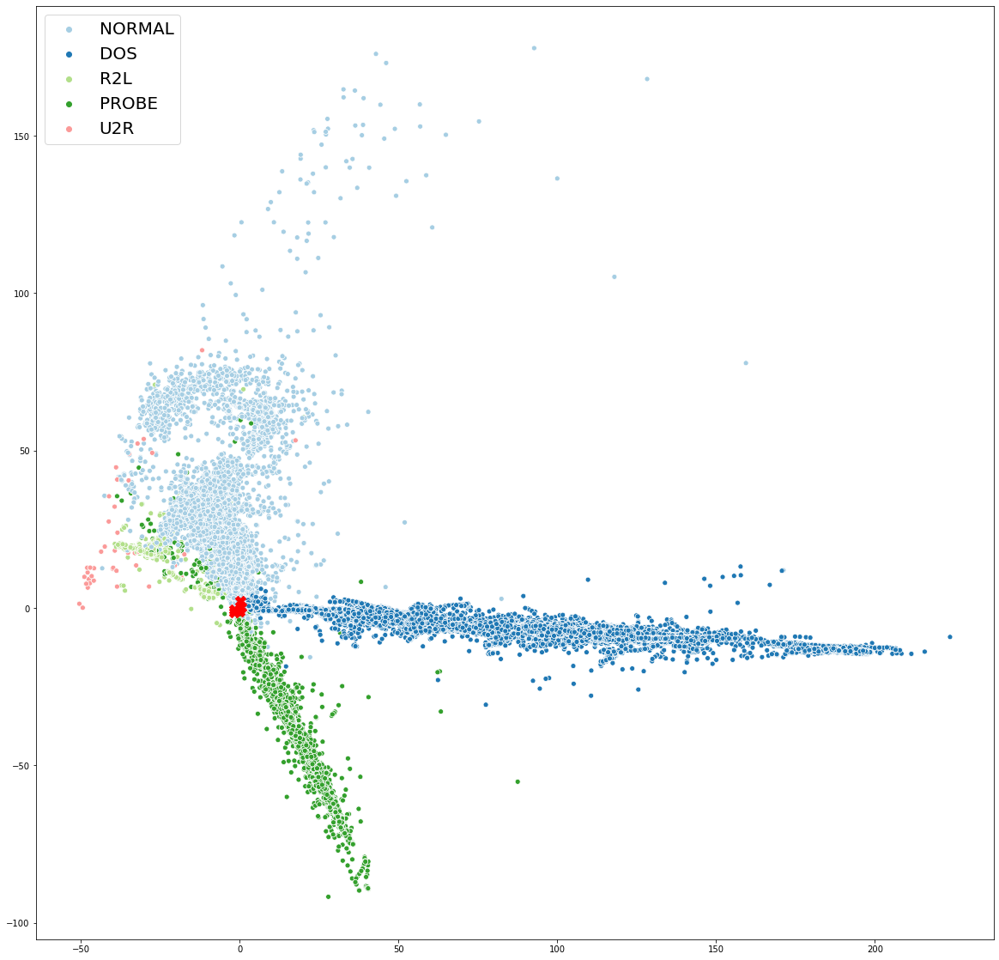

In [ ]:
from matplotlib.colors import ListedColormap
import seaborn as sns

num_classes =['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='upper left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)

plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[ 78.55972426,  -6.58641814],
       [ 85.80653375,  -7.73710784],
       [-16.98151709,  25.65303154],
       ...,
       [  4.36413694,   0.21296461],
       [ -0.51698286,  20.35372695],
       [  5.61484241,  -8.06713373]])

In [ ]:
embedding_label_test = np.array(model_embed_label(label_test))
embedding_label_test = np.unique(embedding_label_test, axis=0)
print(embedding_label_test)

[[-1.7879767  -1.31907886]
 [-1.72930135 -0.50165163]
 [-0.10890817 -1.11811781]
 [ 0.28834298  2.12133249]
 [ 0.51271428  0.18747693]]


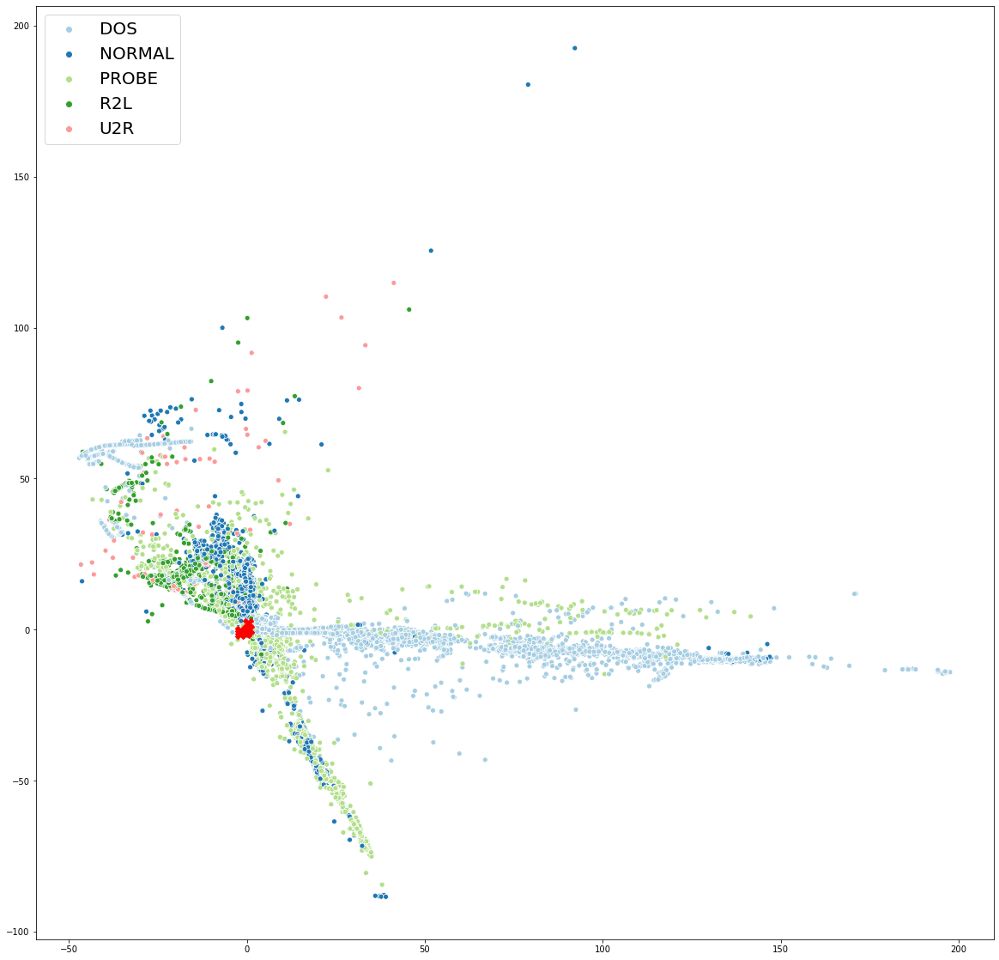

In [ ]:
from matplotlib.colors import ListedColormap
import seaborn as sns

num_classes =['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='upper left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)

plt.show()

### Metrics for the clusters

#### Training set

####  Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

total_label_train =[np.tile(lb5.transform([i]),(len(YTrainAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytrain_prob_hat = np.column_stack([model.predict([XTrainM,i]) for i in total_label_train])
ytrain_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(ytrain_prob_hat))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))


Minutes elapsed: 0.285754


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000633
Minutes elapsed: 0.000431
Minutes elapsed: 3.862968


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.353937,115242.699312,0.703123


####  Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.988115,0.966808,0.967789,0.993198,0.96681,0.96877,0.967789


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000134
Minutes elapsed: 0.000000
Minutes elapsed: 0.124648


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.008139,7934.00319,1.113368


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.4923,0.420398,0.47616,0.686477,0.420555,0.539116,0.472512


## 3.2 Model: 5 labels,LB-CL, ConCE, Embed Dim:10, Distance: Cosine

In [ ]:
x_train, x_test, label_train, label_test, y_train, y_test = XTrainM5_extended, XTestM5_extended, \
                                                            YTrainANMOhe5_extended, YTestANMOhe5_extended,\
                                                            YTrainOutput5, YTestOutput5
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)

(629865, 122) (112720, 122) (629865, 5) (112720, 5) (629865,) (112720,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_5NSL_3 dim 10 v1.0'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
vocab_size = in_dim_label  
embed_dim = 10

def create_model_1(in_dim_x,in_dim_label,out_dim,embed_dim):
    # input variables
    in_x = Input(shape=(in_dim_x,))
    in_label = Input(shape=(in_dim_label,))

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)
    
    #embedding of label
    v = Dense (10, activation='relu')(in_label)
    label_embed = Dense(embed_dim,activation='linear')(v)

    # similarity measure
    dot_product =  dot([x_embed, label_embed], 1, normalize=True)
    
    # sigmoid output layer
    output = Dense(out_dim, activation='sigmoid')(dot_product)
    
    # training model
    m = Model(inputs=[in_x, in_label], outputs= output) # return probability
    m_embed_x = Model(inputs=in_x, outputs= x_embed) # return embedding of x
    m_embed_label = Model(inputs= in_label, outputs= label_embed) # return embedding of label

    
    m.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
    return(m, m_embed_x , m_embed_label)

In [ ]:
#create model
model, model_embed_x , model_embed_label = create_model_1(in_dim_x,in_dim_label,out_dim,embed_dim) 

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 100)          12300       input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 5)]          0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 50)           5050        dense[0][0]                      
______________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense (Dense)                (None, 100)               12300     
_________________________________________________________________
dense_1 (Dense)              (None, 50)                5050      
_________________________________________________________________
dense_2 (Dense)              (None, 10)                510       
Total params: 17,860
Trainable params: 17,860
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_label.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_3 (Dense)              (None, 10)                60        
_________________________________________________________________
dense_4 (Dense)              (None, 10)                110       
Total params: 170
Trainable params: 170
Non-trainable params: 0
_________________________________________________________________


### Training

In [ ]:
t0 = time.time()
# Entrenar el modelo
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='auto')
            ]

history = model.fit([x_train,label_train],y_train,
                    batch_size=100,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Epoch 1/100
5039/5039 [==============================] - 17s 3ms/step - loss: 0.1727 - accuracy: 0.9866 - val_loss: 0.8427 - val_accuracy: 0.6262
Epoch 2/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0113 - accuracy: 0.9983 - val_loss: 1.2828 - val_accuracy: 0.6171
Epoch 3/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0070 - accuracy: 0.9984 - val_loss: 1.3209 - val_accuracy: 0.6179
Epoch 4/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0061 - accuracy: 0.9986 - val_loss: 1.2701 - val_accuracy: 0.6193
Epoch 5/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0055 - accuracy: 0.9987 - val_loss: 1.1894 - val_accuracy: 0.6207
Epoch 6/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0050 - accuracy: 0.9988 - val_loss: 1.0443 - val_accuracy: 0.5634
Epoch 7/100
5039/5039 [==============================] - 14s 3ms/step - loss: 0.0052 - accuracy: 0.9988 - val_loss: 1.1998 -

###  Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

total_label_test =[np.tile(lb5.transform([i]),(len(YTestAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytest_prob_hat = np.column_stack([model.predict([XTestM,i]) for i in total_label_test])
ytest_prob_hat.shape

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.053561


In [ ]:
y_test_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(ytest_prob_hat))
y_test_hat

array(['DOS', 'DOS', 'NORMAL', ..., 'DOS', 'NORMAL', 'PROBE'], dtype='<U6')

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,normalize(ytest_prob_hat, axis=1, norm='l1'))))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7774574166075231
F1 =  0.7430248078565982
Precision_score =  0.8218872509695495
recall_score =  0.7774574166075231
roc_auc_score =  0.7195332965064998
matthews_corr_score =  0.6766321420896872


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.791075,0.800694,0.679621,0.974256
1,DOS,0.934351,0.8938,0.961408,0.835076
2,R2L,0.90024,0.222606,0.949853,0.126077
3,PROBE,0.946904,0.716552,0.839623,0.624948
4,U2R,0.982346,0.0148515,0.75,0.0075


### Cluster visualization with PCA

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


In [ ]:
lb5.transform(num_classes)

array([[1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1]])

In [ ]:
from sklearn.decomposition import PCA

def plot_2d_distribution(embedding_data, num_classes, y, embedding_label, steps = 1, title = ""):
    pca = PCA(n_components = 2)
    decomposed_data = pca.fit_transform(embedding_data)
    plt.figure(figsize = (20,20))
    for label in num_classes:
        
        decomposed_class = decomposed_data[label == y]
        plt.scatter(decomposed_class[::steps, 1], decomposed_class[::steps,0], label = str(label))
        
    embedding_label = np.unique(embedding_label, axis=0)
    embedding_label = pca.transform(embedding_label)
    plt.scatter(embedding_label[:,0],embedding_label[:,1], c="r", marker="X", s=200)
    
    plt.legend(loc='upper right', prop={'size': 20})
    plt.title(title, fontsize=25)
    
    for i, txt in enumerate(num_classes):
        plt.annotate(txt, (embedding_label[i,0]+0.01, embedding_label[i,1]+0.01),fontsize=15)
    
    plt.show()
    

In [ ]:
train_x_embeddings = model_embed_x.predict(XTrainM)
valid_x_embeddings = model_embed_x.predict(XTestM)
train_label_embeddings = model_embed_label.predict(lb5.transform(num_classes))
valid_label_embeddings = model_embed_label.predict(lb5.transform(num_classes))

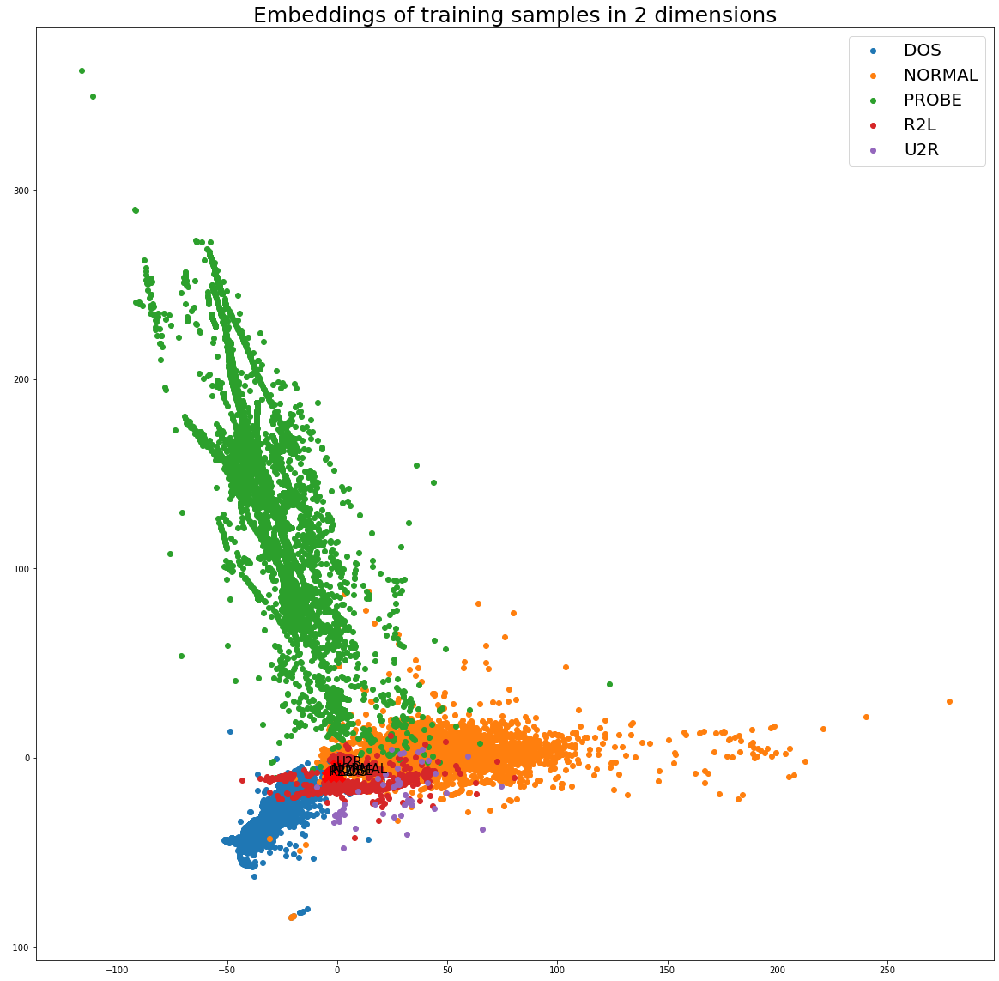

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

plot_2d_distribution(train_x_embeddings, num_classes, YTrainAN5M, train_label_embeddings,
                     title = 'Embeddings of training samples in 2 dimensions' )

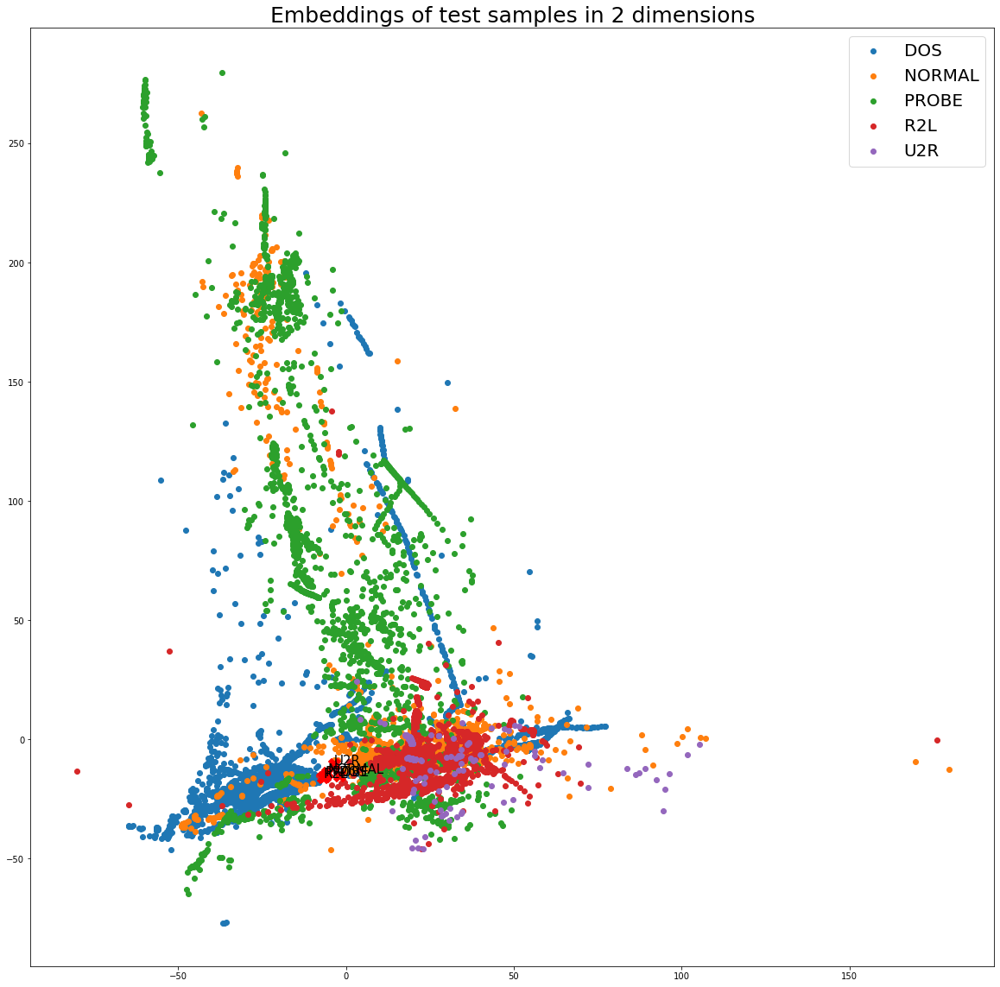

In [ ]:
plot_2d_distribution(valid_x_embeddings, num_classes, YTestAN5M, valid_label_embeddings,
                     title = 'Embeddings of test samples in 2 dimensions')

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

total_label_train =[np.tile(lb5.transform([i]),(len(YTrainAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytrain_prob_hat = np.column_stack([model.predict([XTrainM,i]) for i in total_label_train])
ytrain_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(ytrain_prob_hat))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))



Minutes elapsed: 0.281749


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000816
Minutes elapsed: 0.000575
Minutes elapsed: 3.837532


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.654937,106077.370995,0.688708


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.982904,0.956733,0.963537,0.990277,0.956736,0.970387,0.963513


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000133
Minutes elapsed: 0.000133
Minutes elapsed: 0.124492


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.5348,11993.196625,0.665143


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.492251,0.434583,0.51338,0.698375,0.434738,0.606248,0.506364


## 3.3 Model: 5 labels,LB-CL, ConLE, Embed Dim:2, Distance: Cosine

In [ ]:
x_train, x_test, label_train, label_test, y_train, y_test = XTrainM5_extended, XTestM5_extended, \
                                                            YTrainANMOhe5_extended, YTestANMOhe5_extended,\
                                                            YTrainOutput5, YTestOutput5
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)

(629865, 122) (112720, 122) (629865, 5) (112720, 5) (629865,) (112720,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_3 v1.0'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare model

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

def create_model_1(in_dim_x,in_dim_label,out_dim,embed_dim):
    # input variables
    in_x = Input(shape=(in_dim_x,))
    in_label = Input(shape=(in_dim_label,))


    #embedding de x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)
    
    #embedding de label
    v = Dense (10, activation='relu')(in_label)
    label_embed = Dense(embed_dim,activation='linear')(v)

    # similarity measure
    distance = Lambda(euclidean_distance,
                  output_shape=eucl_dist_output_shape)([x_embed, label_embed])

    
    # training model
    m = Model(inputs=[in_x, in_label], outputs= distance) # return prob
    m_embed_x = Model(inputs=in_x, outputs= x_embed) # return embedding of x
    m_embed_label = Model(inputs= in_label, outputs= label_embed) # return embedding of label
    
    m.compile(loss=contrastive_loss, optimizer=Adam(0.001), metrics=['accuracy'])
    return(m, m_embed_x , m_embed_label)

In [ ]:
#create model
model, model_embed_x , model_embed_label = create_model_1(in_dim_x,in_dim_label,out_dim,embed_dim) 

In [ ]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
dense_6 (Dense)                 (None, 100)          12300       input_3[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 5)]          0                                            
__________________________________________________________________________________________________
dense_7 (Dense)                 (None, 50)           5050        dense_6[0][0]                    
____________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense_6 (Dense)              (None, 100)               12300     
_________________________________________________________________
dense_7 (Dense)              (None, 50)                5050      
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_label.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_9 (Dense)              (None, 10)                60        
_________________________________________________________________
dense_10 (Dense)             (None, 2)                 22        
Total params: 82
Trainable params: 82
Non-trainable params: 0
_________________________________________________________________


### Training

In [ ]:
t0 = time.time()
# Entrenar el modelo
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,label_train],y_train,
                    batch_size=100,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 503892 samples, validate on 125973 samples
Epoch 1/100
503892/503892 [==============================] - 13s 26us/sample - loss: 0.0063 - accuracy: 0.0060 - val_loss: 0.1793 - val_accuracy: 0.3655
Epoch 2/100
503892/503892 [==============================] - 12s 24us/sample - loss: 0.0014 - accuracy: 0.0012 - val_loss: 0.1569 - val_accuracy: 0.3651
Epoch 3/100
503892/503892 [==============================] - 12s 24us/sample - loss: 0.0011 - accuracy: 0.0010 - val_loss: 0.1101 - val_accuracy: 0.3644
Epoch 4/100
503892/503892 [==============================] - 14s 27us/sample - loss: 9.8136e-04 - accuracy: 8.8709e-04 - val_loss: 0.0683 - val_accuracy: 7.7001e-04
Epoch 5/100
503892/503892 [==============================] - 12s 24us/sample - loss: 8.8640e-04 - accuracy: 8.5931e-04 - val_loss: 0.0386 - val_accuracy: 7.1444e-04
Epoch 6/100
503892/503892 [==============================] - 12s 24us/sample - loss: 8.1519e-04 - accuracy: 7.9581e-04 - val_loss: 0.0204 - val_accuracy: 4.842

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

total_label_test =[np.tile(lb5.transform([i]),(len(YTestAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytest_dist_hat = np.column_stack([model.predict([XTestM,i]) for i in total_label_test])
ytest_dist_hat.shape

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))


Minutes elapsed: 0.059335


In [ ]:
y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(ytest_dist_hat))
y_test_hat

array(['DOS', 'DOS', 'NORMAL', ..., 'DOS', 'NORMAL', 'NORMAL'],
      dtype='<U6')

In [ ]:
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7546575585521647
F1 =  0.7183029710257693
Precision_score =  0.7885235765561938
recall_score =  0.7546575585521647
roc_auc_score =  0.7497679491120797
matthews_corr_score =  0.6362458943905701


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.773998,0.778372,0.673821,0.921326
1,DOS,0.926011,0.881803,0.935077,0.834272
2,R2L,0.895759,0.153458,0.959459,0.0833986
3,PROBE,0.931778,0.677703,0.687792,0.667906
4,U2R,0.981769,0.0637813,0.358974,0.035


###  Cluster visualization

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

In [ ]:
embedding_x_train = np.array(model_embed_x(x_train))
embedding_x_train

array([[-0.03622053, -0.15750329],
       [-0.03622053, -0.15750329],
       [ 0.34125291, -1.09660723],
       ...,
       [-0.03622053, -0.15750329],
       [ 0.34118672, -1.09563357],
       [ 0.01797458, -0.09651372]])

In [ ]:
embedding_label_train = np.array(model_embed_label(label_train))
embedding_label_train = np.unique(embedding_label_train, axis=0)
print(embedding_label_train)

[[-0.47631792  0.74385956]
 [-0.03507976 -0.15668419]
 [ 0.34390982 -1.10190613]
 [ 0.66657073  0.62182106]
 [ 1.03456155 -0.32538842]]


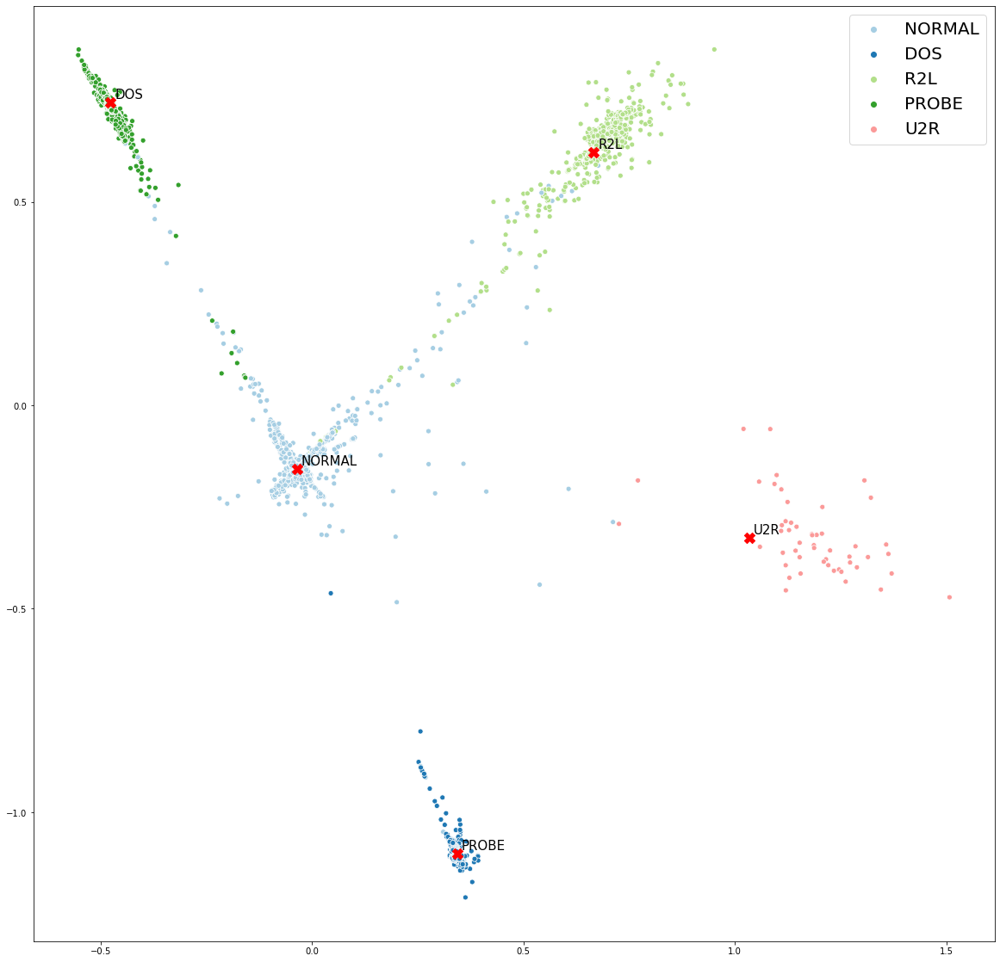

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

num_classes =['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='upper right', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.01, embedding_label_train[i,1]+0.01),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x(x_test))
embedding_x_test

array([[ 0.34261668, -1.10138555],
       [ 0.34555675, -1.10331233],
       [-0.03622053, -0.15750329],
       ...,
       [ 0.34380268, -1.12216142],
       [-0.03622053, -0.15750329],
       [-0.16540916,  0.01270262]])

In [ ]:
embedding_label_test = np.array(model_embed_label(label_test))
embedding_label_test = np.unique(embedding_label_test, axis=0)
print(embedding_label_test)

[[-0.47631792  0.74385956]
 [-0.03507976 -0.15668419]
 [ 0.34390982 -1.10190613]
 [ 0.66657073  0.62182106]
 [ 1.03456155 -0.32538842]]


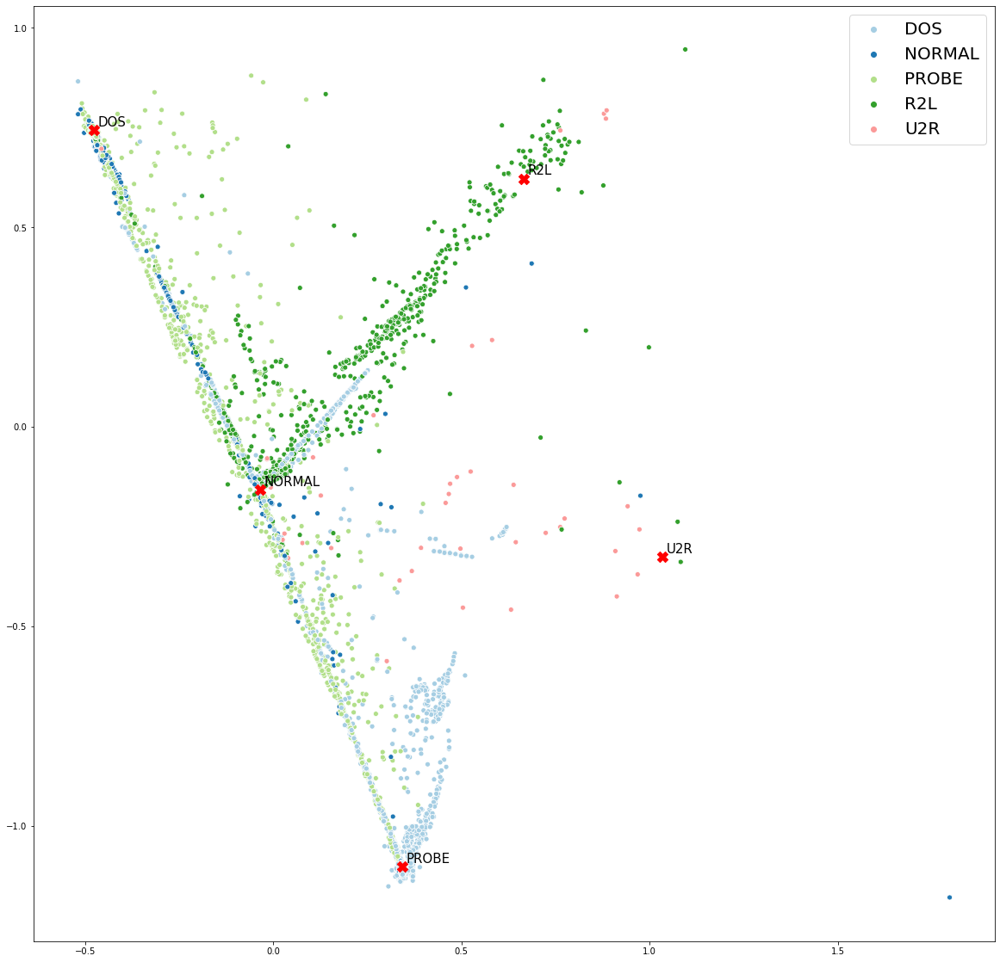

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

num_classes =['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='upper right', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.01, embedding_label_test[i,1]+0.01),fontsize=15)
plt.show()

### Cluster metrics

#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

total_label_train =[np.tile(lb5.transform([i]),(len(YTrainAN5MOhe),1)) for i in ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']]
ytrain_dist_hat = np.column_stack([model.predict([XTrainM,i]) for i in total_label_train])
ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(ytrain_dist_hat))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))



Minutes elapsed: 0.301197


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000517
Minutes elapsed: 0.000450
Minutes elapsed: 3.789936


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.995027,5.291629e+07,0.152857


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.998365,0.994633,0.994681,0.999064,0.994729,0.994633,0.994681


### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000000
Minutes elapsed: 0.000261
Minutes elapsed: 0.123976


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.88891,146798.496285,0.439686


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.465789,0.41697,0.481854,0.673645,0.417134,0.556616,0.476885


## 3.4 Model: 5 labels,RLB-CL, E2NMS, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)

[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Preparar modelo

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths
     
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(tf.exp(dist_to_true - min_dist_to_false),(-1,1))
    
    # model output
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # # list of distances between x and labels

    m.compile(loss='mse', optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#crear modelo
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [ ]:
model.summary()

Model: "functional_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 5, 5)         0           input_3[0][0]                    
__________________________________________________________________________________________________
dense_49 (Dense)                (None, 100)          12300       input_3[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice_5 (Te [(None, 5)]          0           lambda_18[0][0]                  
______________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense_49 (Dense)             (None, 100)               12300     
_________________________________________________________________
dense_50 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_51 (Dense)             (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 5, 5)         0           input_3[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice_5 (Te [(None, 5)]          0           lambda_18[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_6 (Te [(None, 5)]          0           lambda_18[0][0]                  
______________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 9s 91us/sample - loss: 0.1587 - mean_squared_error: 0.1587 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 2/100
100778/100778 [==============================] - 8s 84us/sample - loss: 0.0542 - mean_squared_error: 0.0542 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 3/100
100778/100778 [==============================] - 9s 87us/sample - loss: 0.0419 - mean_squared_error: 0.0419 - val_loss: 0.0353 - val_mean_squared_error: 0.0353
Epoch 4/100
100778/100778 [==============================] - 8s 84us/sample - loss: 0.0479 - mean_squared_error: 0.0479 - val_loss: 0.0317 - val_mean_squared_error: 0.0317
Epoch 5/100
100778/100778 [==============================] - 12s 119us/sample - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 6/100
100778/100778 [==============================] - 8s 83us/sample - loss: 0.0

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.017583
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
#build probabilities from distances
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7830908445706175
F1 =  0.7516327838238424
Precision_score =  0.784649028688544
recall_score =  0.7830908445706175
roc_auc_score =  0.7763729541687118
matthews_corr_score =  0.6837114174020957


d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.802209,0.80852,0.69343,0.969416
1,DOS,0.929693,0.885452,0.960339,0.8214
2,R2L,0.895005,0.231743,0.677419,0.139781
3,PROBE,0.957017,0.78385,0.852085,0.725733
4,U2R,0.982257,0,0,0


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[ 0.98305452, -0.94216186],
       [ 0.91728225, -1.36354939],
       [ 2.28705195,  2.90530984],
       ...,
       [ 1.09237601, -1.18442425],
       [ 2.17774875,  2.86416862],
       [ 0.33953821, -0.26084735]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 1.63084715  2.41121302]
 [ 1.46031839 -1.19050558]
 [-2.03464077 -1.76377171]
 [-1.56398743  1.21133307]
 [-2.25461911  1.02018708]]


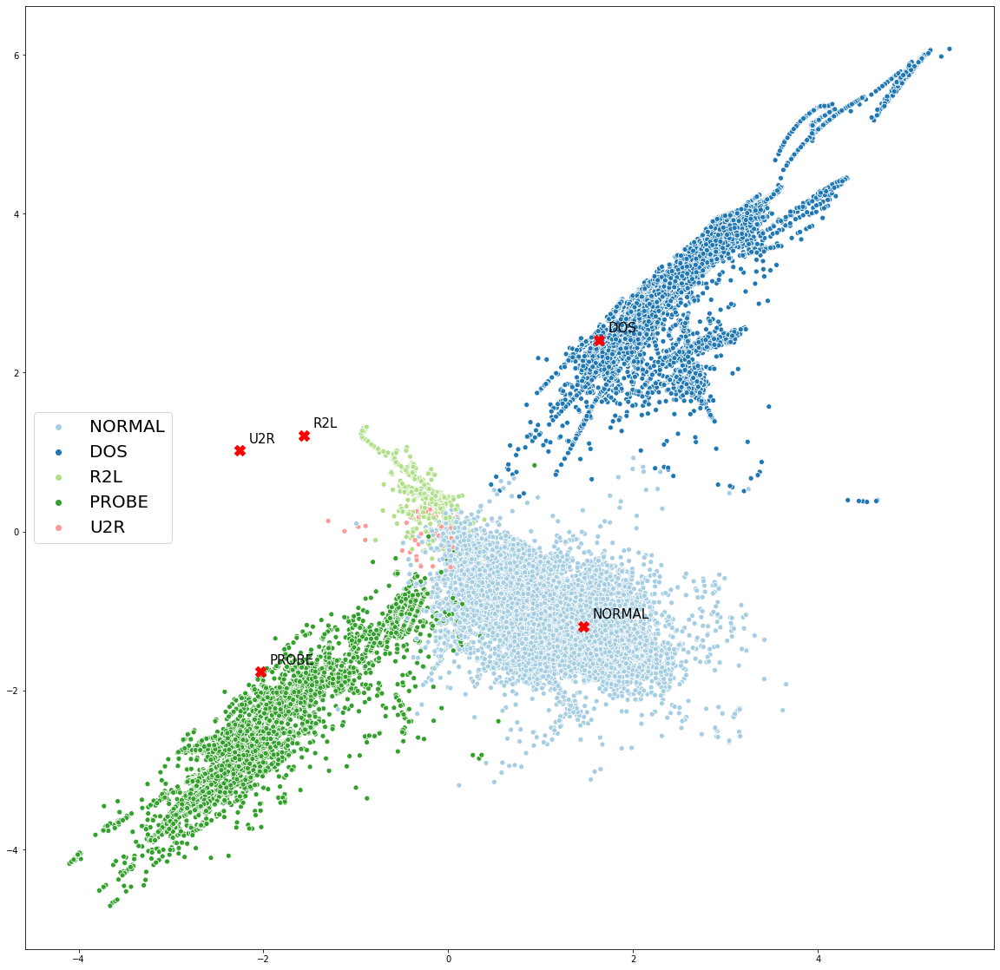

In [ ]:
from matplotlib.colors import ListedColormap
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[ 3.31713367,  4.02683168],
       [ 2.59710199,  3.2852241 ],
       [ 0.86710006, -0.61528528],
       ...,
       [ 3.27435437,  2.47117472],
       [ 1.78482036, -1.30075836],
       [-1.31549285, -1.56641589]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 1.63084715  2.41121302]
 [ 1.46031839 -1.19050558]
 [-2.03464077 -1.76377171]
 [-1.56398743  1.21133307]
 [-2.25461911  1.02018708]]


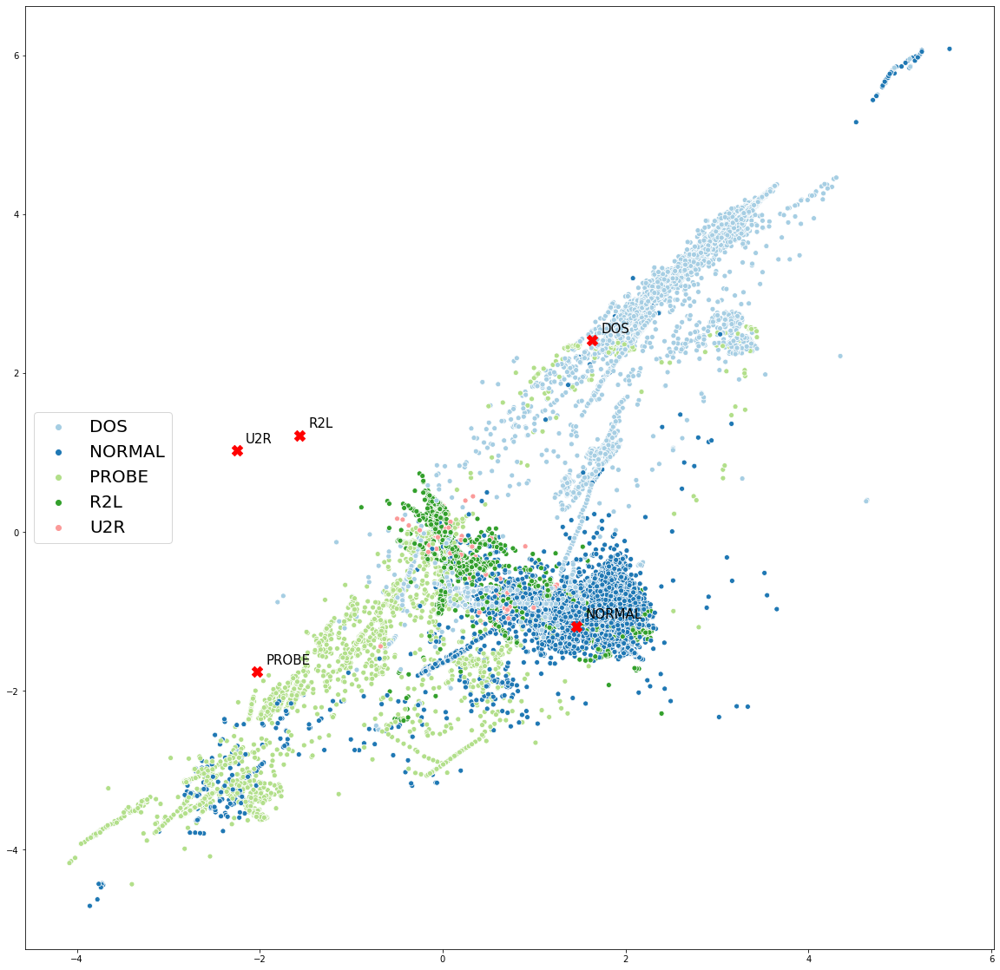

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))



Minutes elapsed: 0.175382


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000466
Minutes elapsed: 0.000416
Minutes elapsed: 3.890990


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.747268,554296.14549,0.298986


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.993997,0.980827,0.982693,0.996565,0.980828,0.984561,0.982691


#### Test set

####   Metrics not  based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000100
Minutes elapsed: 0.000117
Minutes elapsed: 0.128291


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.494601,41227.962855,0.494296


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.510196,0.449557,0.518096,0.703925,0.449671,0.596933,0.512942


## 3.5 Model: 5 labels,RLB-CL, E2NAMS, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)

[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet_v2 dim2 v1.0'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths
        
    
    #working list
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    average_dist_to_false = tf.reduce_mean(dist_to_false, axis = 1)
    out = tf.reshape(tf.exp(dist_to_true - min_dist_to_false - average_dist_to_false),(-1,1))
    
    # model output
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # # list of distances between x and labels

    m.compile(loss='mse', optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_249"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_69 (Lambda)              (None, 5, 5)         0           input_41[0][0]                   
__________________________________________________________________________________________________
dense_180 (Dense)               (None, 100)          12300       input_41[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_49 (T [(None, 5)]          0           lambda_69[0][0]                  
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_41 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_180 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_181 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_182 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_253"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_69 (Lambda)              (None, 5, 5)         0           input_41[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_49 (T [(None, 5)]          0           lambda_69[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_50 (T [(None, 5)]          0           lambda_69[0][0]                  
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# Train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 10s 96us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 1.9631e-07 - val_mean_squared_error: 1.9631e-07
Epoch 2/100
100778/100778 [==============================] - 8s 79us/sample - loss: 8.0638e-08 - mean_squared_error: 8.0638e-08 - val_loss: 3.2207e-08 - val_mean_squared_error: 3.2207e-08
Epoch 3/100
100778/100778 [==============================] - 9s 85us/sample - loss: 1.7259e-08 - mean_squared_error: 1.7259e-08 - val_loss: 9.4492e-09 - val_mean_squared_error: 9.4492e-09
Epoch 4/100
100778/100778 [==============================] - 8s 79us/sample - loss: 5.4621e-09 - mean_squared_error: 5.4621e-09 - val_loss: 3.3432e-09 - val_mean_squared_error: 3.3432e-09
Epoch 5/100
100778/100778 [==============================] - 8s 79us/sample - loss: 2.0171e-09 - mean_squared_error: 2.0171e-09 - val_loss: 1.3358e-09 - val_mean_squared_error: 1.3358e-09
Epoch 6/100
1007

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.019332
['R2L' 'R2L' 'R2L' ... 'R2L' 'R2L' 'R2L']


In [ ]:
# build probabilities from distances
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' 
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.17015613910574875
F1 =  0.1500945673610267
Precision_score =  0.14124427701198908
recall_score =  0.17015613910574875
roc_auc_score =  0.5934656427365684
matthews_corr_score =  -0.03971005902191388


d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.569242,0,0,0
1,DOS,0.608809,0.436881,0.417043,0.458702
2,R2L,0.287394,0.049127,0.028938,0.16249
3,PROBE,0.89261,0,0,0
4,U2R,0.982257,0,0,0


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-11.26465522,  -7.27146687],
       [-11.00929013,  -7.25826252],
       [-13.17272218,  -8.2298496 ],
       ...,
       [-14.6170287 ,  -9.19129276],
       [-12.5586392 ,  -7.99498467],
       [-13.66577714,  -8.86599816]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 0.10679628 -0.02250165]
 [ 0.44348495 -0.07490052]
 [-0.06447386  0.41678673]
 [ 0.42210821 -0.53448934]
 [ 0.22374821  0.03854854]]


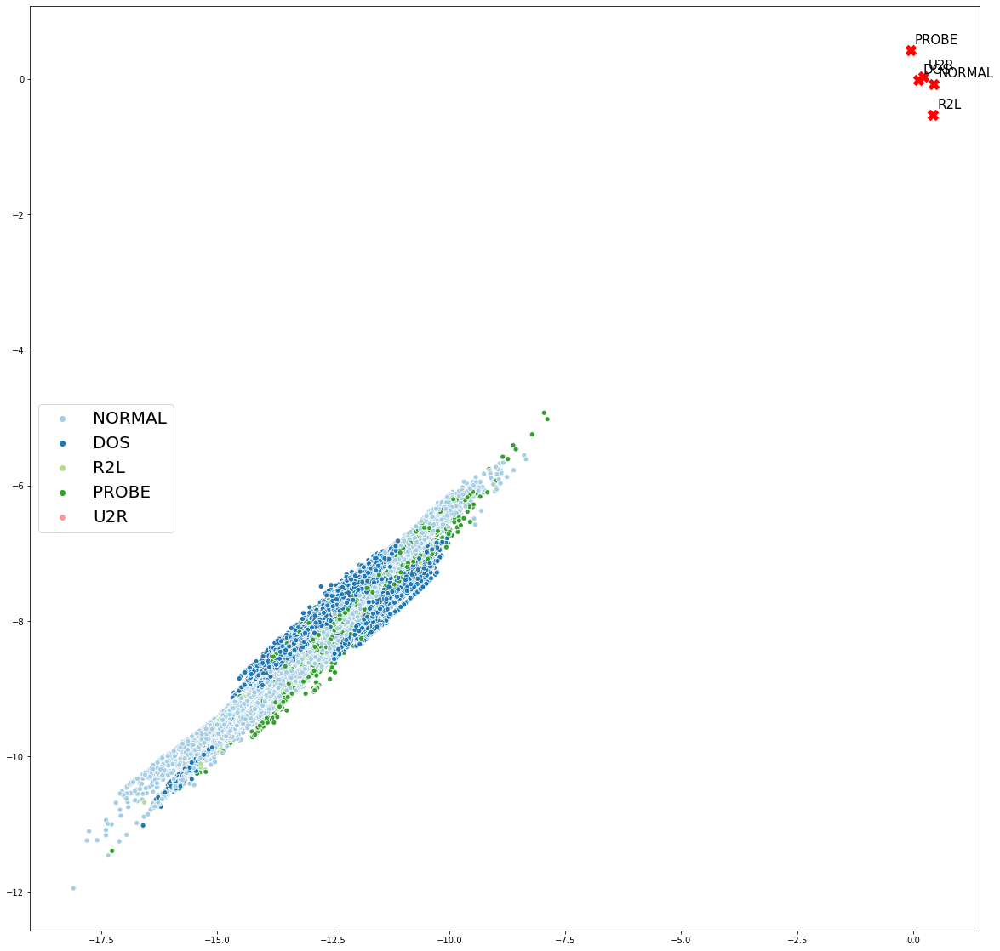

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[-12.10398125,  -8.24396831],
       [-11.47949525,  -7.83462078],
       [-12.26285152,  -8.00700223],
       ...,
       [-16.17684731, -10.5938789 ],
       [-13.40045403,  -8.73187683],
       [-12.07962142,  -8.0471787 ]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 0.10679628 -0.02250165]
 [ 0.44348495 -0.07490052]
 [-0.06447386  0.41678673]
 [ 0.42210821 -0.53448934]
 [ 0.22374821  0.03854854]]


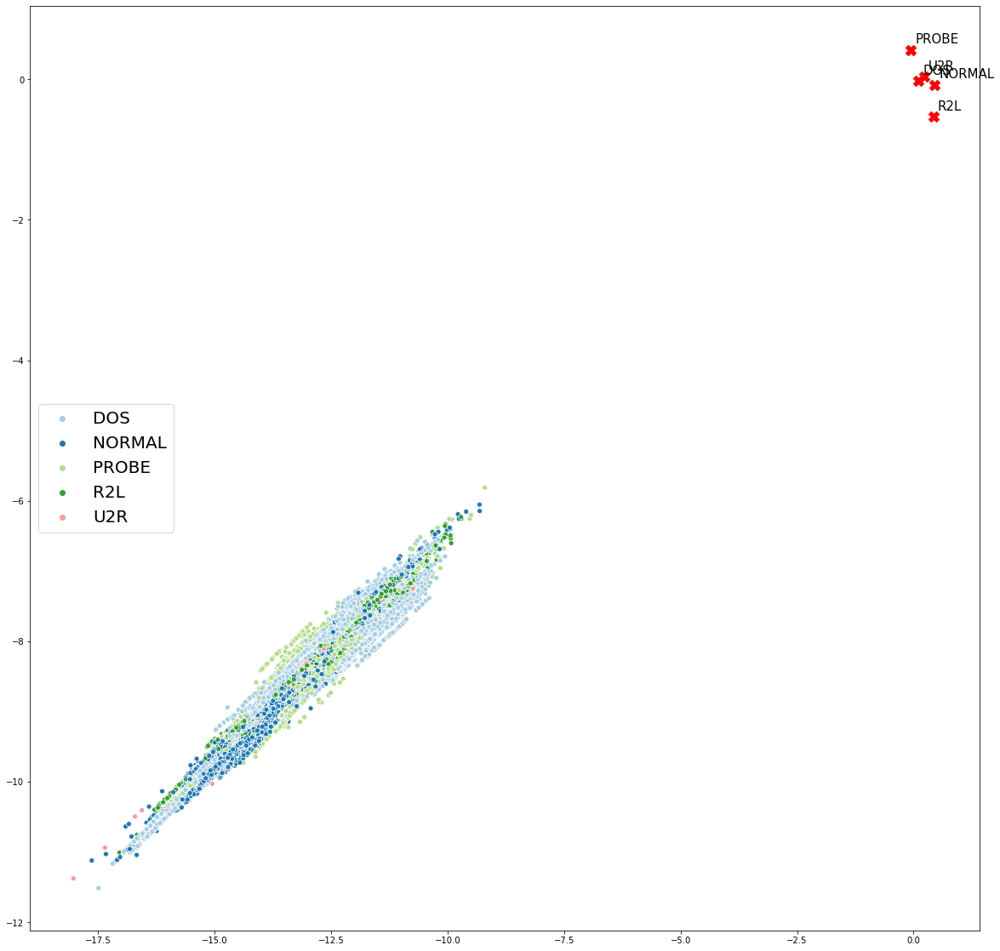

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set 

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))



Minutes elapsed: 0.096761


In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000416
Minutes elapsed: 0.000400
Minutes elapsed: 3.782516


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.245884,34043.124327,1.496244


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.2758,0.171616,0.202569,0.611712,0.171629,0.239086,0.199818


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000117
Minutes elapsed: 0.000100
Minutes elapsed: 0.124159


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.105213,1994.647273,2.656594


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.150982,0.096061,0.134657,0.50786,0.096123,0.188638,0.127352


## 3.6 Model: 5 labels,RLB-CL, E2WNAMS (1,0.5,0.5), Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet_v4 dim2 v1.0'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    average_dist_to_false = tf.reduce_mean(dist_to_false, axis = 1)
    out = tf.reshape(tf.exp(dist_to_true - 0.5 * min_dist_to_false - 0.5 * average_dist_to_false),(-1,1))
    
    # Model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # Matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels

    m.compile(loss='mse', optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_249"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_69 (Lambda)              (None, 5, 5)         0           input_41[0][0]                   
__________________________________________________________________________________________________
dense_180 (Dense)               (None, 100)          12300       input_41[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_49 (T [(None, 5)]          0           lambda_69[0][0]                  
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_41 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_180 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_181 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_182 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_253"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_69 (Lambda)              (None, 5, 5)         0           input_41[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_49 (T [(None, 5)]          0           lambda_69[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_50 (T [(None, 5)]          0           lambda_69[0][0]                  
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 10s 98us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.0345 - val_mean_squared_error: 0.0345
Epoch 2/100
100778/100778 [==============================] - 8s 80us/sample - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0262 - val_mean_squared_error: 0.0262
Epoch 3/100
100778/100778 [==============================] - 8s 83us/sample - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 4/100
100778/100778 [==============================] - 8s 80us/sample - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 5/100
100778/100778 [==============================] - 8s 76us/sample - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0171 - val_mean_squared_error: 0.0171
Epoch 6/100
100778/100778 [==============================] - 8s 75us/sample - loss: 0.01

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.019044
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
# Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7851312987934705
F1 =  0.7527847161386653
Precision_score =  0.770339005330656
recall_score =  0.7851312987934705
roc_auc_score =  0.6780178166838419
matthews_corr_score =  0.6861523369384867


d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Perform test evaluation one vs. rest

Percentage per label class

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.81077,0.815437,0.703126,0.970446
1,DOS,0.925346,0.87807,0.955083,0.81255
2,R2L,0.887376,0.196773,0.512356,0.12177
3,PROBE,0.964514,0.826464,0.87026,0.786865
4,U2R,0.982257,0,0,0


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-1.17869702, -1.58032669],
       [-2.67998091, -0.50252122],
       [ 2.45146253, -5.42382679],
       ...,
       [-2.4785463 , -1.97675845],
       [ 2.97196294, -5.28188268],
       [-0.47130338, -1.10198599]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 2.57351401 -4.17817403]
 [-2.45178149 -1.20963738]
 [-1.67394826  1.85820598]
 [ 1.82352718  0.05181993]
 [ 1.74078623  2.35889908]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


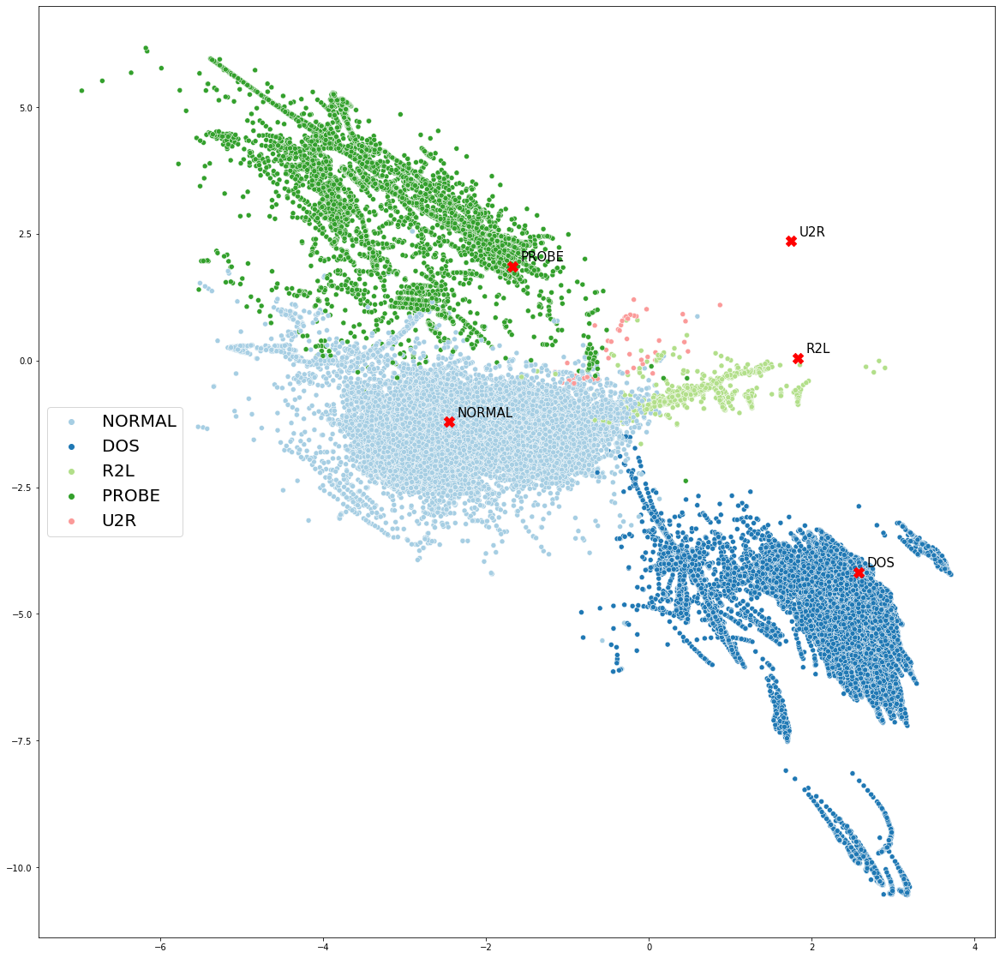

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[ 2.48764113, -6.17274573],
       [ 1.996962  , -4.86699406],
       [-0.907984  , -2.02399374],
       ...,
       [ 0.54332004, -4.88139348],
       [-2.91284896, -2.50996013],
       [-1.24123327,  1.10590526]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 2.57351401 -4.17817403]
 [-2.45178149 -1.20963738]
 [-1.67394826  1.85820598]
 [ 1.82352718  0.05181993]
 [ 1.74078623  2.35889908]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


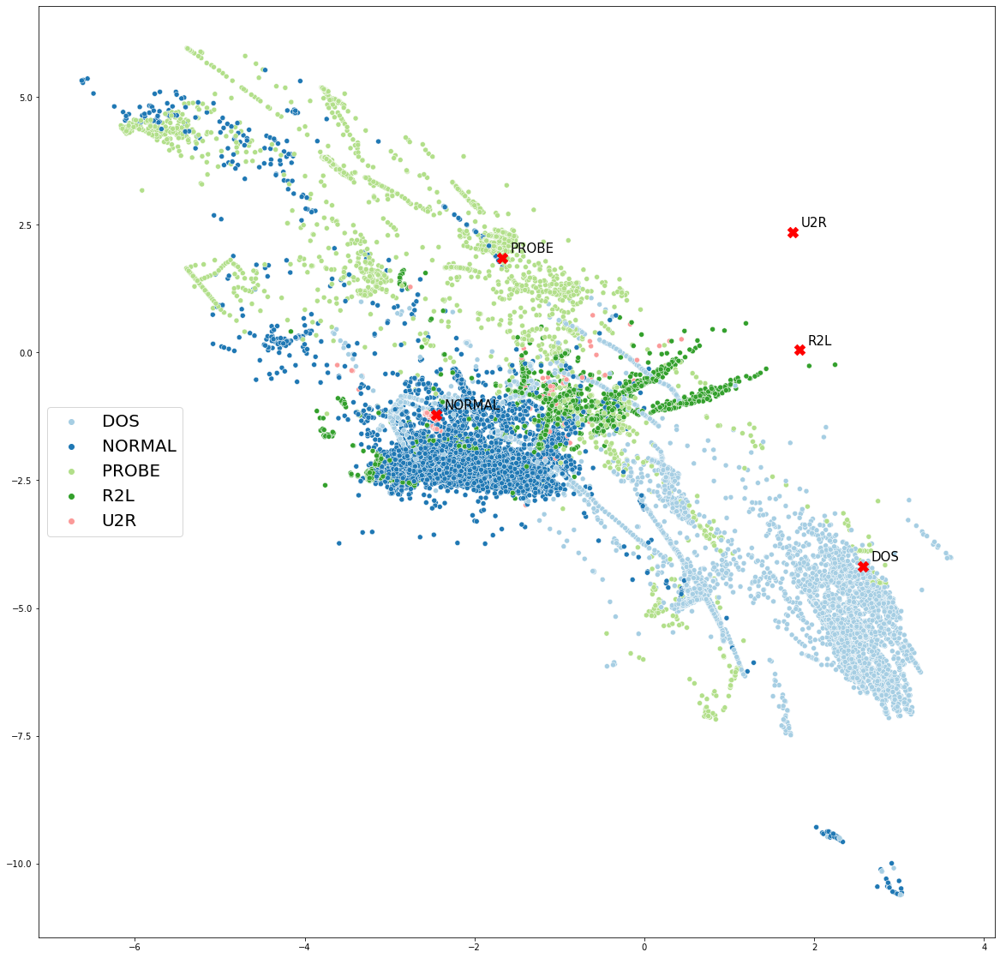

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.107840
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000502
Minutes elapsed: 0.000503
Minutes elapsed: 3.812328


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.697098,459897.41301,0.381279


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.991518,0.975042,0.976349,0.995143,0.975043,0.977657,0.976348


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000134
Minutes elapsed: 0.000000
Minutes elapsed: 0.124677


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.003266,355.520458,12.282318


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.523943,0.466214,0.531683,0.710017,0.466325,0.606202,0.527142


## 3.7 Model: 5 labels, RLB-CL, ENMS, Embed dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v10 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths
 
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(tf.exp(dist_to_true - min_dist_to_false),(-1,1))
    
    # model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # Matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # List of distances between x and labels

    m.compile(loss=dummy_loss, optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_373"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_57 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_137 (Lambda)             (None, 5, 5)         0           input_57[0][0]                   
__________________________________________________________________________________________________
dense_401 (Dense)               (None, 100)          12300       input_57[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_131 ( [(None, 5)]          0           lambda_137[0][0]                 
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_375"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_57 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_401 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_402 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_403 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_377"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_57 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_137 (Lambda)             (None, 5, 5)         0           input_57[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_131 ( [(None, 5)]          0           lambda_137[0][0]                 
__________________________________________________________________________________________________
tf_op_layer_strided_slice_132 ( [(None, 5)]          0           lambda_137[0][0]                 
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 21s 204us/sample - loss: 0.1872 - mean_squared_error: 5.5123 - val_loss: 0.0662 - val_mean_squared_error: 0.2674
Epoch 2/100
100778/100778 [==============================] - 14s 140us/sample - loss: 0.0555 - mean_squared_error: 0.2672 - val_loss: 0.0523 - val_mean_squared_error: 0.1298
Epoch 3/100
100778/100778 [==============================] - 14s 142us/sample - loss: 0.0416 - mean_squared_error: 0.2051 - val_loss: 0.0393 - val_mean_squared_error: 0.3781
Epoch 4/100
100778/100778 [==============================] - 14s 138us/sample - loss: 0.0342 - mean_squared_error: 0.1312 - val_loss: 0.0380 - val_mean_squared_error: 0.4589
Epoch 5/100
100778/100778 [==============================] - 14s 140us/sample - loss: 0.0648 - mean_squared_error: 18.3838 - val_loss: 0.0373 - val_mean_squared_error: 0.3784
Epoch 6/100
100778/100778 [==============================] - 14s 139us/sample 

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.026708
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
# Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:

average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7906316536550745
F1 =  0.7530084853359007
Precision_score =  0.7931426739792887
recall_score =  0.7906316536550745
roc_auc_score =  0.7287142255235712
matthews_corr_score =  0.6955452574582447


d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.806645,0.812055,0.698487,0.969725
1,DOS,0.936081,0.89724,0.958264,0.843524
2,R2L,0.893187,0.162726,0.726708,0.091621
3,PROBE,0.963094,0.818973,0.865287,0.777365
4,U2R,0.982257,0,0,0


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-2.29500466,  2.38656204],
       [-2.04447372,  2.56239691],
       [-5.29292228, -4.95685096],
       ...,
       [-2.70445339,  2.19250903],
       [-5.00808953, -4.53871483],
       [-1.05110822,  1.35627799]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-4.26994943 -3.42288396]
 [-3.28509489  2.82620105]
 [ 3.24330379  3.73026987]
 [ 1.8656805  -1.37349355]
 [ 3.37213072 -1.36005872]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


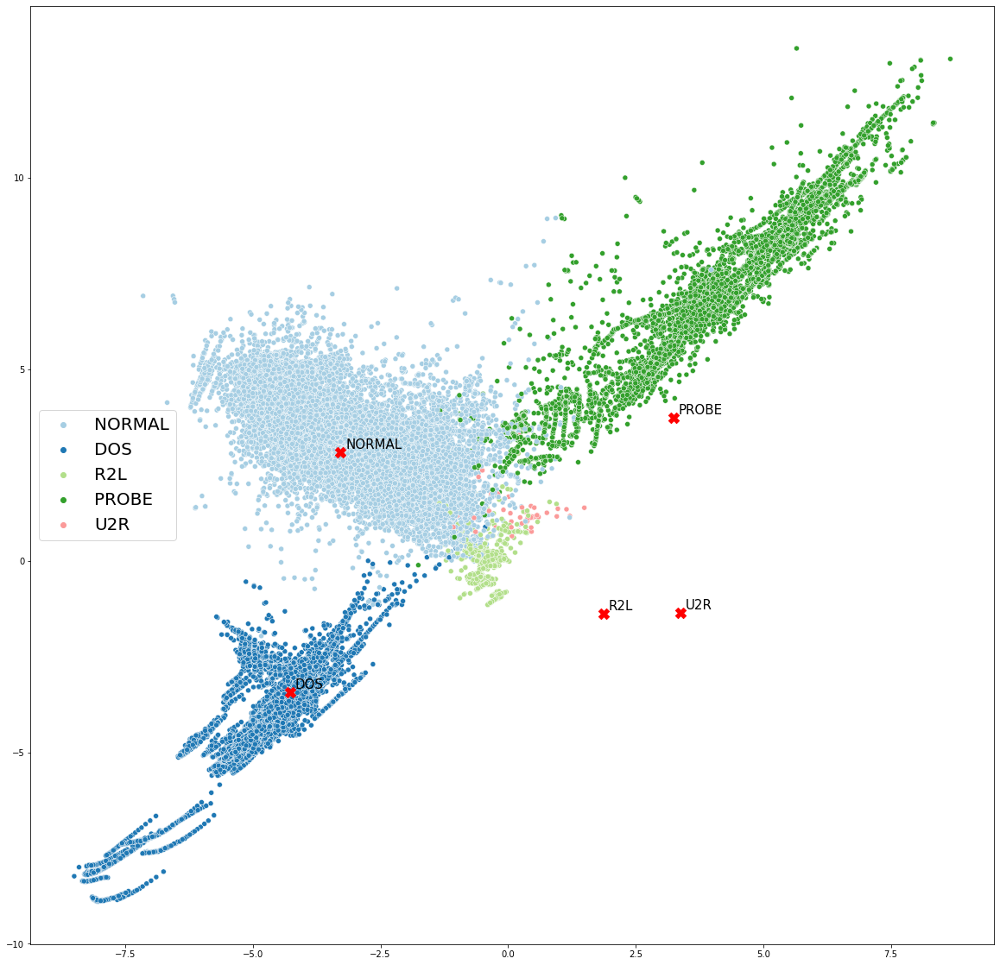

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[-5.01688321, -4.69974   ],
       [-4.27809552, -3.92660692],
       [-2.43175688,  1.68133988],
       ...,
       [-5.77045783, -3.10227403],
       [-4.07723513,  3.4766008 ],
       [ 0.90905433,  4.60351314]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-4.26994943 -3.42288396]
 [-3.28509489  2.82620105]
 [ 3.24330379  3.73026987]
 [ 1.8656805  -1.37349355]
 [ 3.37213072 -1.36005872]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


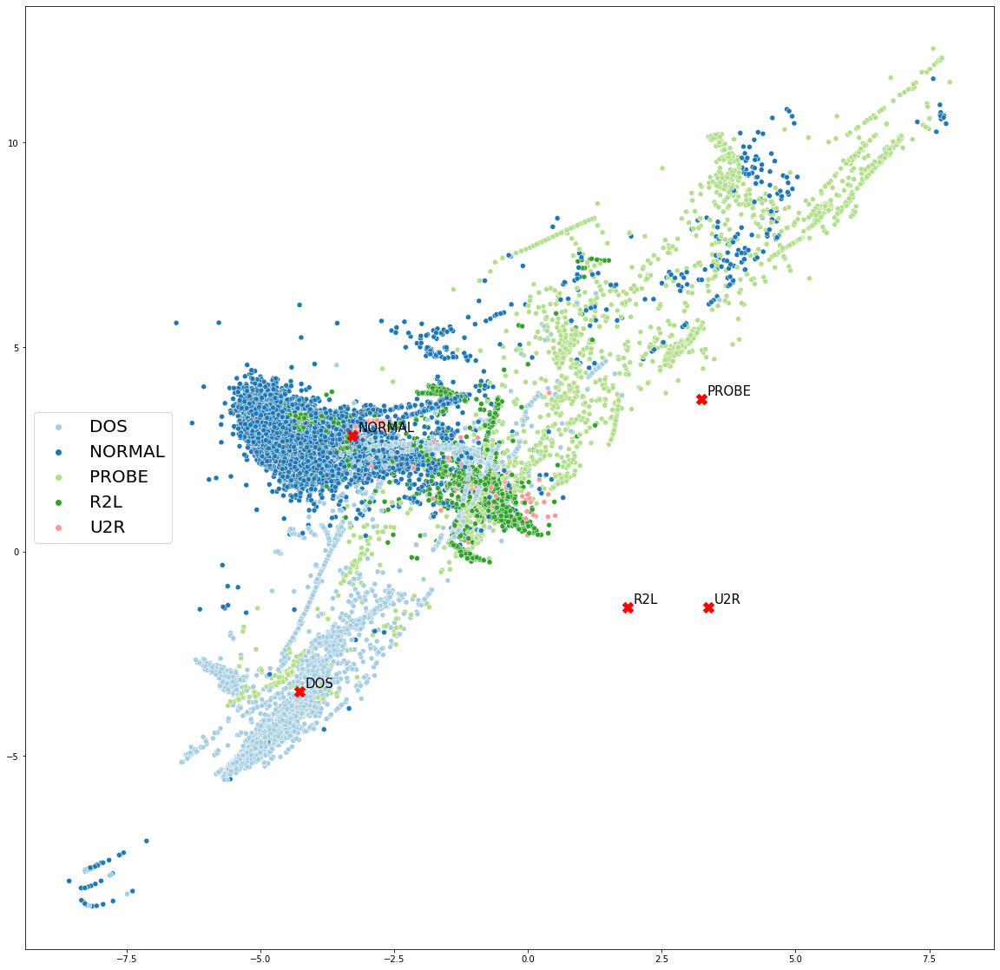

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.162906
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000521
Minutes elapsed: 0.000521
Minutes elapsed: 3.846820


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.703408,508634.496874,0.339078


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.993251,0.980628,0.980714,0.996134,0.980629,0.980798,0.980714


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000000
Minutes elapsed: 0.000261
Minutes elapsed: 0.124786


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.070471,16523.008388,10.982391


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.531848,0.471145,0.547557,0.717775,0.471255,0.636214,0.541449


## 3.8 Model: 5 labels, RLB-CL, CE+ENMS, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v11 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths  
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # classification output
    n = Dense (20, activation='relu')(x_embed)
    n = Dense (20, activation='relu')(n)
    out_classification = Dense(in_dim_label,activation='softmax')(n)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(tf.exp(dist_to_true - min_dist_to_false),(-1,1))
    
    # model output
    m = Model(inputs=[in_x,in_index_label],outputs= [out, out_classification]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels
    m_out_classification = Model(inputs=in_x, outputs= out_classification)  # classification output

    m.compile(loss=[dummy_loss, 'categorical_crossentropy'], optimizer=Adam(0.001), metrics=['mse','accuracy'] , loss_weights = [0.5,0.5] )
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist, m_out_classification)

In [ ]:
#crear modelo
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist, model_out_classification = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_403"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_63 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_155 (Lambda)             (None, 5, 5)         0           input_63[0][0]                   
__________________________________________________________________________________________________
dense_446 (Dense)               (None, 100)          12300       input_63[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_146 ( [(None, 5)]          0           lambda_155[0][0]                 
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_63 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_446 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_447 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_448 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_407"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_63 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_155 (Lambda)             (None, 5, 5)         0           input_63[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_146 ( [(None, 5)]          0           lambda_155[0][0]                 
__________________________________________________________________________________________________
tf_op_layer_strided_slice_147 ( [(None, 5)]          0           lambda_155[0][0]                 
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,YTrainAN5MOhe],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 24s 236us/sample - loss: 0.1337 - tf_op_layer_Reshape_115_loss: 0.1658 - dense_451_loss: 0.1014 - tf_op_layer_Reshape_115_mean_squared_error: 0.5682 - tf_op_layer_Reshape_115_acc: 0.9154 - dense_451_mean_squared_error: 0.0094 - dense_451_acc: 0.9745 - val_loss: 0.0417 - val_tf_op_layer_Reshape_115_loss: 0.0651 - val_dense_451_loss: 0.0184 - val_tf_op_layer_Reshape_115_mean_squared_error: 0.2584 - val_tf_op_layer_Reshape_115_acc: 0.9817 - val_dense_451_mean_squared_error: 0.0017 - val_dense_451_acc: 0.9948
Epoch 2/100
100778/100778 [==============================] - 17s 167us/sample - loss: 0.0382 - tf_op_layer_Reshape_115_loss: 0.0568 - dense_451_loss: 0.0196 - tf_op_layer_Reshape_115_mean_squared_error: 0.3436 - tf_op_layer_Reshape_115_acc: 0.9848 - dense_451_mean_squared_error: 0.0019 - dense_451_acc: 0.9940 - val_loss: 0.0296 - val_tf_op_layer_Reshape_115_loss: 0.0459 - va

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.008095
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
ytest_prob_hat=  model_out_classification.predict(x_test)

In [ ]:

average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7802963094393187
F1 =  0.7454119735226005
Precision_score =  0.811054311465008
recall_score =  0.7802963094393187
roc_auc_score =  0.8454401417156877
matthews_corr_score =  0.6804309776005663


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.79285,0.801581,0.682315,0.971373
1,DOS,0.937145,0.898865,0.960934,0.844328
2,R2L,0.898155,0.204986,0.886228,0.115897
3,PROBE,0.950364,0.735898,0.85848,0.643949
4,U2R,0.982079,0.0288462,0.375,0.015


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[ 1.47676108,  2.17762812],
       [ 2.78680017,  2.01775006],
       [-5.07665591, -2.66005643],
       ...,
       [ 2.03195977,  3.44694599],
       [-5.11980534, -2.68451946],
       [-0.0768378 ,  2.59293901]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-4.54072986 -2.59263103]
 [ 2.67482679  3.62743585]
 [ 5.65844651 -3.00300206]
 [-4.54661038  4.25307127]
 [ 1.06101731 -5.87388822]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


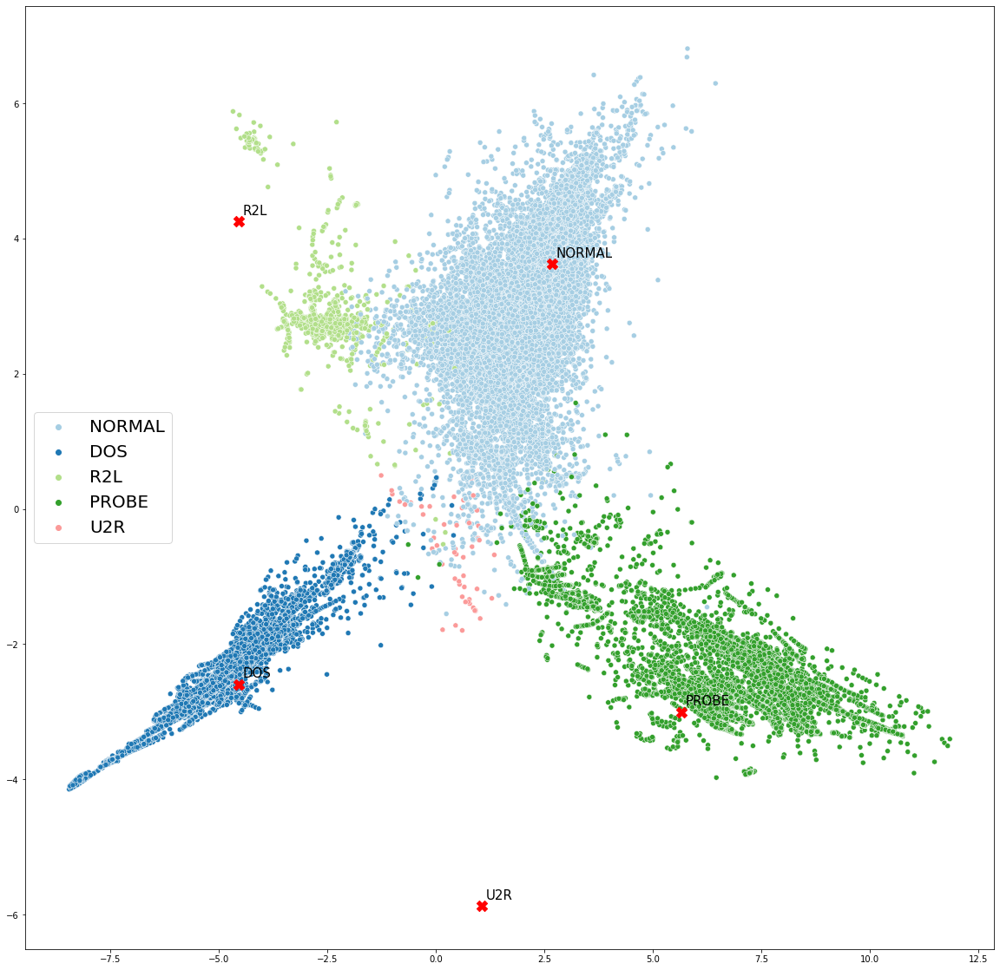

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[-5.92833501, -2.94780119],
       [-4.71834921, -2.47529305],
       [ 1.20067862,  3.10776406],
       ...,
       [-2.90254689, -1.36390366],
       [ 2.68589075,  3.85612426],
       [ 4.1670927 , -0.77435302]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-4.54072986 -2.59263103]
 [ 2.67482679  3.62743585]
 [ 5.65844651 -3.00300206]
 [-4.54661038  4.25307127]
 [ 1.06101731 -5.87388822]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


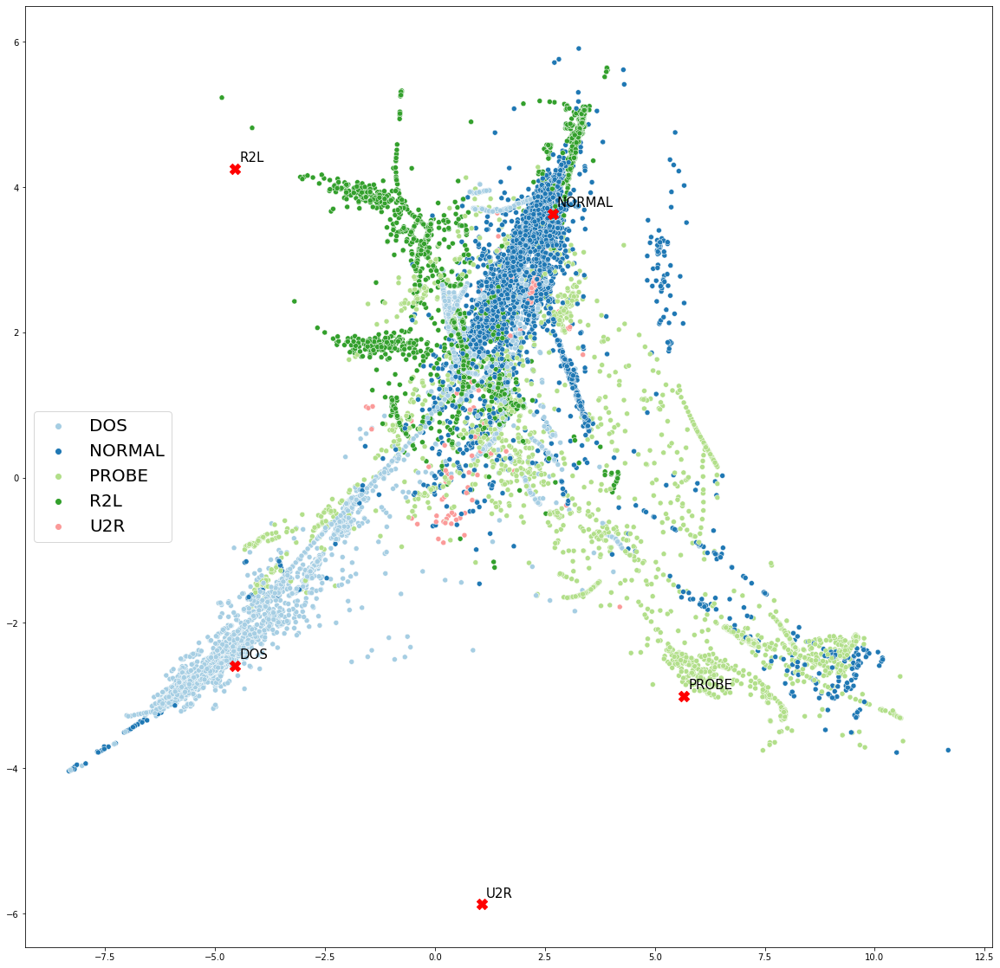

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.053476
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000521
Minutes elapsed: 0.000260
Minutes elapsed: 3.930586


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.776841,755590.566276,0.280765


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.994006,0.983127,0.983134,0.996567,0.983128,0.98314,0.983134


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000134
Minutes elapsed: 0.000000
Minutes elapsed: 0.127588


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,-0.077582,11487.695496,14.007205


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.50088,0.440702,0.518688,0.702823,0.440858,0.610258,0.511908


## 3.9 Model: 5 labels, RLB-CL, NMM, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v12 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))    
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths  
    
    # working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - min_dist_to_false,(-1,1))
    
    # model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distance between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distance between x and labels

    m.compile(loss=dummy_loss_max_margin, optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#crear modelo
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_415"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_65 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_161 (Lambda)             (None, 5, 5)         0           input_65[0][0]                   
__________________________________________________________________________________________________
dense_462 (Dense)               (None, 100)          12300       input_65[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_151 ( [(None, 5)]          0           lambda_161[0][0]                 
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_65 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_462 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_463 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_464 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_419"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_65 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_161 (Lambda)             (None, 5, 5)         0           input_65[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_151 ( [(None, 5)]          0           lambda_161[0][0]                 
__________________________________________________________________________________________________
tf_op_layer_strided_slice_152 ( [(None, 5)]          0           lambda_161[0][0]                 
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 22s 217us/sample - loss: 0.0780 - mean_squared_error: 1.3008 - val_loss: 0.0165 - val_mean_squared_error: 1.6020
Epoch 2/100
100778/100778 [==============================] - 15s 144us/sample - loss: 0.0130 - mean_squared_error: 1.9295 - val_loss: 0.0106 - val_mean_squared_error: 2.0209
Epoch 3/100
100778/100778 [==============================] - 15s 151us/sample - loss: 0.0100 - mean_squared_error: 2.1451 - val_loss: 0.0101 - val_mean_squared_error: 2.0218
Epoch 4/100
100778/100778 [==============================] - 15s 147us/sample - loss: 0.0086 - mean_squared_error: 2.1874 - val_loss: 0.0088 - val_mean_squared_error: 2.1096
Epoch 5/100
100778/100778 [==============================] - 15s 153us/sample - loss: 0.0078 - mean_squared_error: 2.3026 - val_loss: 0.0064 - val_mean_squared_error: 2.3560
Epoch 6/100
100778/100778 [==============================] - 15s 151us/sample -

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.020315
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
# Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7550567778566359
F1 =  0.7375830345515157
Precision_score =  0.7808444117365617
recall_score =  0.7550567778566359
roc_auc_score =  0.7121844747689622
matthews_corr_score =  0.638266903616063


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.787926,0.790408,0.688168,0.928329
1,DOS,0.915366,0.858625,0.959589,0.776884
2,R2L,0.910043,0.40771,0.802299,0.273297
3,PROBE,0.914035,0.606577,0.596407,0.6171
4,U2R,0.982745,0.0974478,0.677419,0.0525


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-2.00726308, -5.12839521],
       [-1.56283618, -2.42359025],
       [ 0.87026349,  8.00890846],
       ...,
       [-1.40823258, -2.05847378],
       [ 0.68727147,  7.2696677 ],
       [-1.96404364, -5.95331779]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-0.20170322  2.05263531]
 [-1.981755   -0.45932083]
 [-2.74903038  0.72465094]
 [ 3.75001347 -3.10461841]
 [ 2.18112348  0.38441763]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


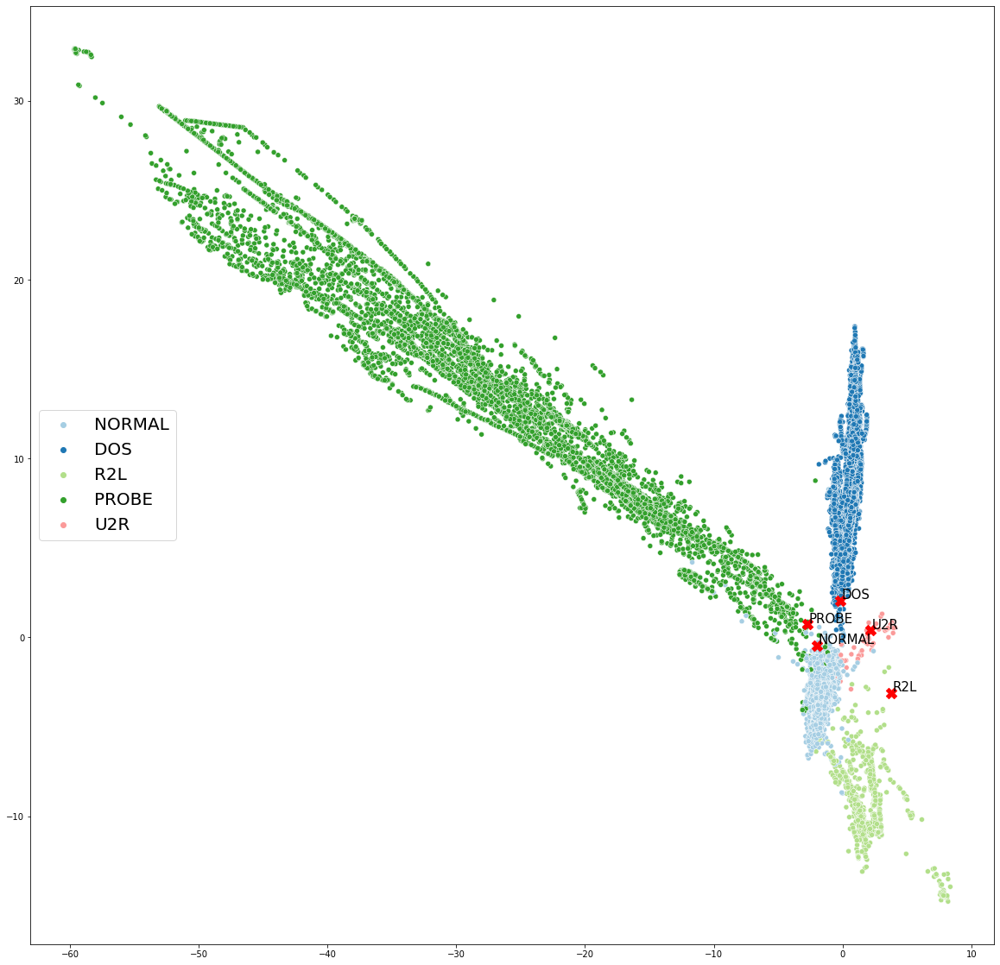

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[ 1.15475261, 15.60475609],
       [ 0.94113939, 15.02441675],
       [-1.63378722, -2.8550247 ],
       ...,
       [-0.69145809, 12.63675276],
       [-1.8758776 , -3.84554887],
       [-2.11270971,  0.45281979]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-0.20170322  2.05263531]
 [-1.981755   -0.45932083]
 [-2.74903038  0.72465094]
 [ 3.75001347 -3.10461841]
 [ 2.18112348  0.38441763]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


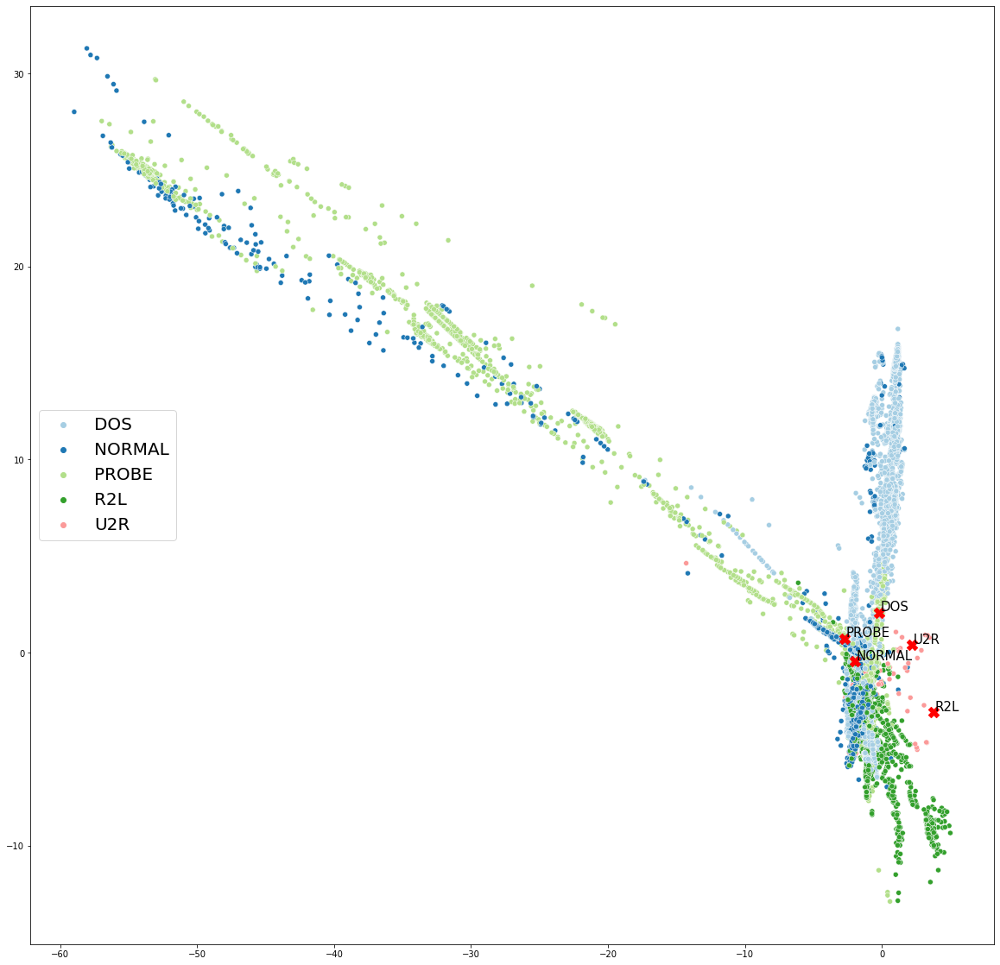

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.122384
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000630
Minutes elapsed: 0.000521
Minutes elapsed: 3.871470


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.739122,157509.859357,0.423997


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.997636,0.991834,0.992466,0.998646,0.991834,0.993097,0.992465


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000000
Minutes elapsed: 0.000260
Minutes elapsed: 0.130225


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,-0.207272,10898.650054,5.293561


####   Metrics based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.45599,0.401576,0.445328,0.660573,0.401744,0.493641,0.442976


## 3.10 Model: 5 labels, RLB-CL, CE+NMM, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v13 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # classification output
    n = Dense (20, activation='relu')(x_embed)
    n = Dense (20, activation='relu')(n)
    out_classification = Dense(in_dim_label,activation='softmax')(n)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - min_dist_to_false,(-1,1))
    
    # model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= [out, out_classification]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels
    m_out_classification = Model(inputs=in_x, outputs= out_classification)  # classification output

    m.compile(loss=[dummy_loss_max_margin, 'categorical_crossentropy'], optimizer=Adam(0.001), metrics=['mse','accuracy'] , loss_weights = [0.5,0.5] )
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist, m_out_classification)

In [ ]:
#crear modelo
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist, model_out_classification = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_425"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_167 (Lambda)             (None, 5, 5)         0           input_67[0][0]                   
__________________________________________________________________________________________________
dense_475 (Dense)               (None, 100)          12300       input_67[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_156 ( [(None, 5)]          0           lambda_167[0][0]                 
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_427"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_67 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_475 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_476 (Dense)            (None, 50)                5050      
_________________________________________________________________
dense_477 (Dense)            (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_429"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_167 (Lambda)             (None, 5, 5)         0           input_67[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_156 ( [(None, 5)]          0           lambda_167[0][0]                 
__________________________________________________________________________________________________
tf_op_layer_strided_slice_157 ( [(None, 5)]          0           lambda_167[0][0]                 
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,YTrainAN5MOhe],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 24s 240us/sample - loss: 0.0879 - tf_op_layer_Reshape_121_loss: 0.0554 - dense_480_loss: 0.1204 - tf_op_layer_Reshape_121_mean_squared_error: 1.8734 - tf_op_layer_Reshape_121_acc: 0.9897 - dense_480_mean_squared_error: 0.0109 - dense_480_acc: 0.9767 - val_loss: 0.0220 - val_tf_op_layer_Reshape_121_loss: 0.0185 - val_dense_480_loss: 0.0255 - val_tf_op_layer_Reshape_121_mean_squared_error: 2.5291 - val_tf_op_layer_Reshape_121_acc: 0.9944 - val_dense_480_mean_squared_error: 0.0022 - val_dense_480_acc: 0.9923
Epoch 2/100
100778/100778 [==============================] - 16s 164us/sample - loss: 0.0199 - tf_op_layer_Reshape_121_loss: 0.0173 - dense_480_loss: 0.0226 - tf_op_layer_Reshape_121_mean_squared_error: 2.2774 - tf_op_layer_Reshape_121_acc: 0.9954 - dense_480_mean_squared_error: 0.0020 - dense_480_acc: 0.9938 - val_loss: 0.0185 - val_tf_op_layer_Reshape_121_loss: 0.0174 - va

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],
                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

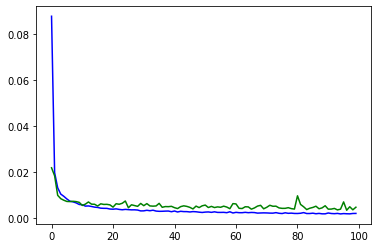

Minimum val_loss at epoch 97 = 0.0035


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()


# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)


### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.017133
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
ytest_prob_hat=  model_out_classification.predict(x_test)

In [ ]:

average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7494677075940384
F1 =  0.7157525905742123
Precision_score =  0.7572118757422684
recall_score =  0.7494677075940384
roc_auc_score =  0.8518297650864788
matthews_corr_score =  0.6290689616448811


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.765614,0.771986,0.664414,0.92112
1,DOS,0.926544,0.880519,0.95314,0.818182
2,R2L,0.891812,0.160991,0.66289,0.091621
3,PROBE,0.933064,0.680635,0.697917,0.664188
4,U2R,0.981902,0.0331754,0.318182,0.0175


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[ -3.53366436,   1.38496422],
       [-15.00975793,   2.35533002],
       [-42.30614026, -12.85965108],
       ...,
       [ -9.90478867,   2.79190856],
       [-47.80555927, -15.22711405],
       [ -0.42863441,   1.81719077]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 0.02376476 -6.64202824]
 [ 0.60421656  2.14550814]
 [ 3.01038459 -0.74298435]
 [ 1.82916429  2.59390124]
 [ 1.75752412 -3.26413801]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


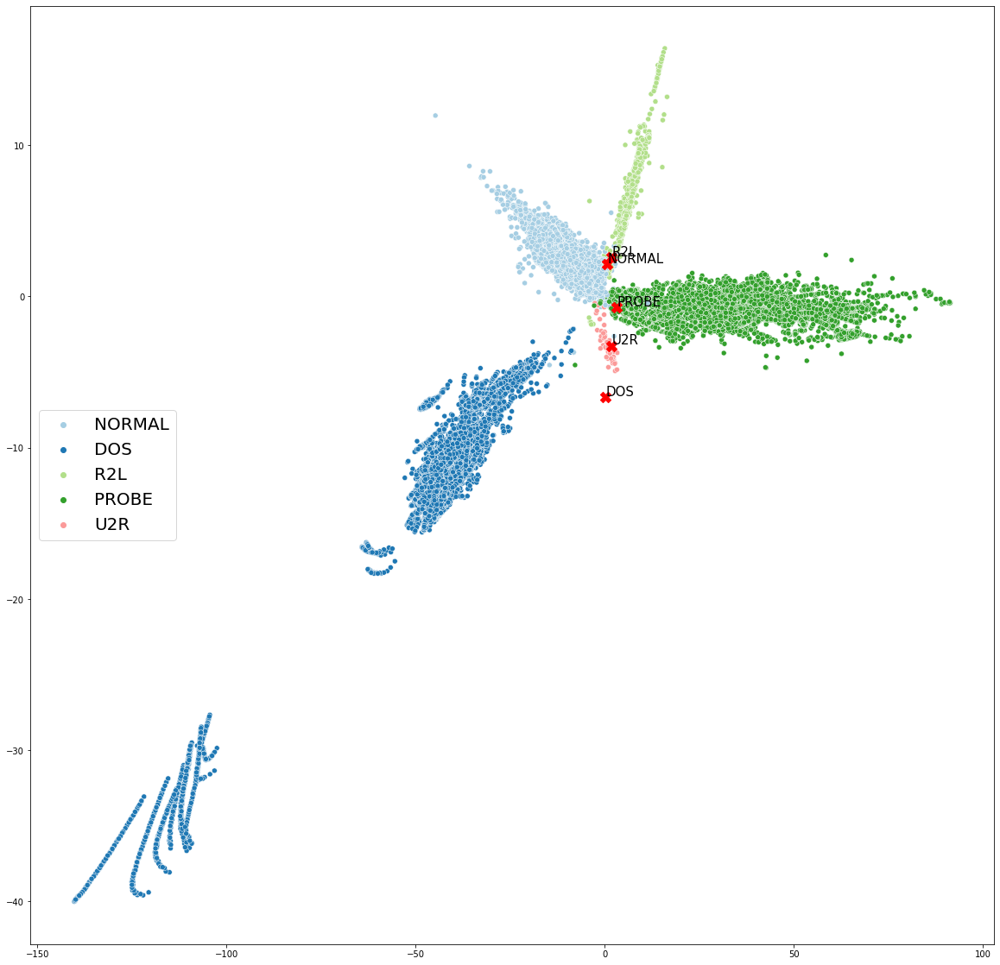

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[-41.95977637, -11.08675058],
       [-31.80457165,  -8.3233094 ],
       [ -9.12382787,   2.36369295],
       ...,
       [-28.13527244,  -7.54066333],
       [-12.24673797,   3.58289201],
       [ 14.37744295,  -1.12910144]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 0.02376476 -6.64202824]
 [ 0.60421656  2.14550814]
 [ 3.01038459 -0.74298435]
 [ 1.82916429  2.59390124]
 [ 1.75752412 -3.26413801]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


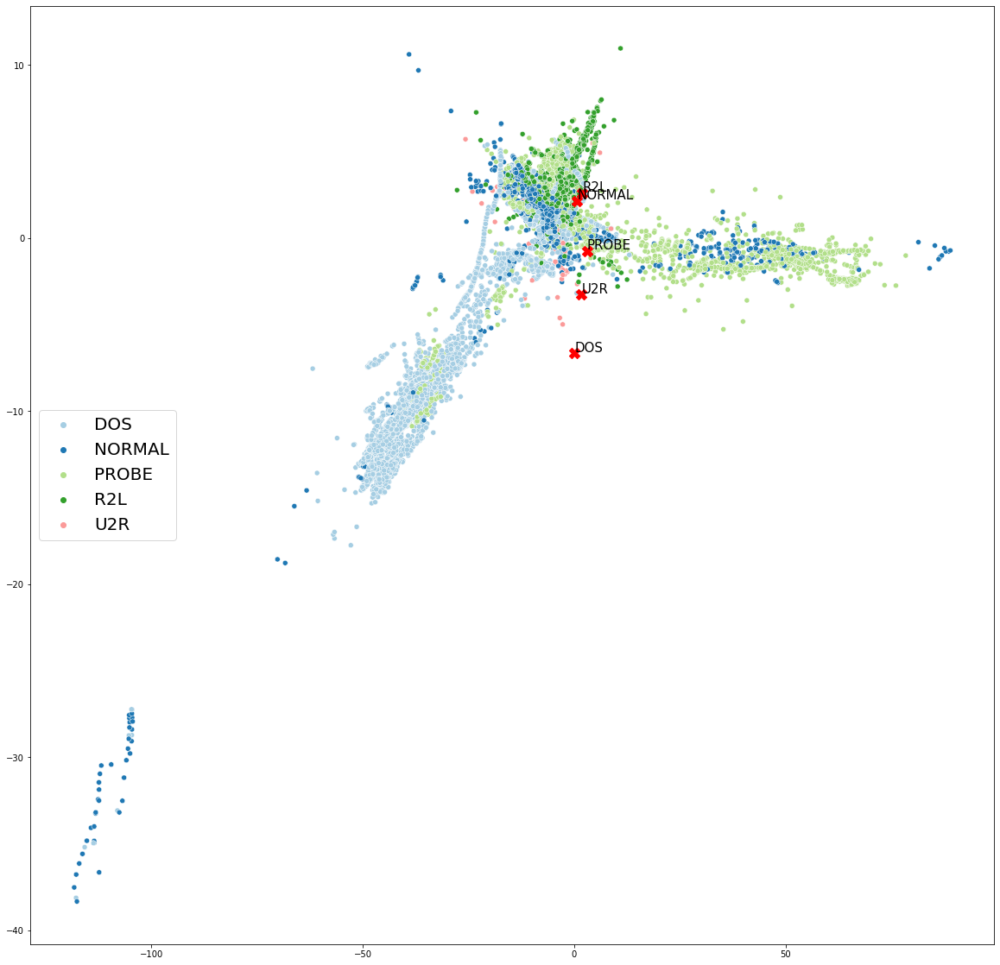

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.071944
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000521
Minutes elapsed: 0.000521
Minutes elapsed: 3.882013


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.663849,244105.945995,0.397164


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.998418,0.994407,0.994614,0.999094,0.994407,0.994821,0.994614


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000000
Minutes elapsed: 0.000261
Minutes elapsed: 0.125971


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.068848,11995.246601,6.665596


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.449021,0.402617,0.463812,0.663916,0.402784,0.534086,0.459234


## 3.11 Model: 5 labels, RLB-CL, CEDist+NMM, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v14 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(20, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (100, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - min_dist_to_false,(-1,1))
    
    xembed_mas_distancias = tf.reshape(tf.concat([x_embed,mat_dist], axis = 1),(-1,embed_dim+in_dim_label))
    # classification output
    n = Dense (100, activation='relu')(xembed_mas_distancias)
    n = Dense (50, activation='relu')(n)
    out_classification = Dense(in_dim_label,activation='softmax')(n)

    # model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= [out, out_classification]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels
    m_out_classification = Model(inputs=in_x, outputs= out_classification)  # Classification output
    m_xembed_mas_distancias = Model(inputs=in_x, outputs= xembed_mas_distancias) 

    m.compile(loss=[dummy_loss_max_margin, 'categorical_crossentropy'], optimizer=Adam(0.001), metrics=['mse','accuracy'] , loss_weights = [0.5,0.5] )
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist, m_out_classification,m_xembed_mas_distancias)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist, model_out_classification,model_xembed_mas_distancias = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_247"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_81 (Lambda)              (None, 5, 5)         0           input_33[0][0]                   
__________________________________________________________________________________________________
dense_232 (Dense)               (None, 100)          12300       input_33[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_65 (T [(None, 5)]          0           lambda_81[0][0]                  
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_249"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_232 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_233 (Dense)            (None, 100)               10100     
_________________________________________________________________
dense_234 (Dense)            (None, 2)                 202       
Total params: 22,602
Trainable params: 22,602
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_251"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_81 (Lambda)              (None, 5, 5)         0           input_33[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_65 (T [(None, 5)]          0           lambda_81[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_66 (T [(None, 5)]          0           lambda_81[0][0]                  
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,YTrainAN5MOhe],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 16s 160us/sample - loss: 0.0613 - tf_op_layer_Reshape_60_loss: 0.0572 - dense_237_loss: 0.0654 - tf_op_layer_Reshape_60_mean_squared_error: 2.2137 - tf_op_layer_Reshape_60_acc: 0.9884 - dense_237_mean_squared_error: 0.0059 - dense_237_acc: 0.9832 - val_loss: 0.0208 - val_tf_op_layer_Reshape_60_loss: 0.0233 - val_dense_237_loss: 0.0184 - val_tf_op_layer_Reshape_60_mean_squared_error: 3.0242 - val_tf_op_layer_Reshape_60_acc: 0.9905 - val_dense_237_mean_squared_error: 0.0015 - val_dense_237_acc: 0.9957
Epoch 2/100
100778/100778 [==============================] - 13s 125us/sample - loss: 0.0199 - tf_op_layer_Reshape_60_loss: 0.0221 - dense_237_loss: 0.0176 - tf_op_layer_Reshape_60_mean_squared_error: 3.2442 - tf_op_layer_Reshape_60_acc: 0.9907 - dense_237_mean_squared_error: 0.0015 - dense_237_acc: 0.9953 - val_loss: 0.0186 - val_tf_op_layer_Reshape_60_loss: 0.0198 - val_dense_23

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],
                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

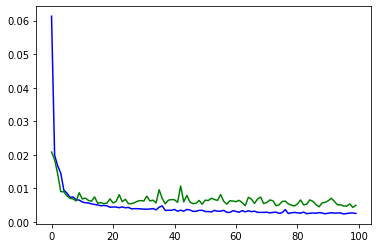

Minimum val_loss at epoch 99 = 0.0043


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()


# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)


### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.027107
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'NORMAL']


In [ ]:
ytest_prob_hat=  model_out_classification.predict(x_test)

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7457860184528035
F1 =  0.7095995440478544
Precision_score =  0.7240176287146982
recall_score =  0.7457860184528035
roc_auc_score =  0.838207052846843
matthews_corr_score =  0.6223193164341999


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.768275,0.773912,0.667488,0.920708
1,DOS,0.929915,0.886576,0.95411,0.82797
2,R2L,0.882896,0.10387,0.390306,0.059906
3,PROBE,0.929116,0.658109,0.682645,0.635275
4,U2R,0.98137,0.0277778,0.1875,0.015


###  Cluster visualization

### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[ 3.6462903 , -1.6258415 ],
       [15.20039089, -9.47319441],
       [46.22384768, 35.06435423],
       ...,
       [11.80011718, -6.25791797],
       [35.078949  , 36.85735841],
       [ 0.64137107,  0.9319522 ]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 1.90807333  5.10778552]
 [-0.05967949 -0.90207567]
 [-2.64845626 -1.17741498]
 [-0.46145669  3.228826  ]
 [-1.42623828 -1.15938285]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


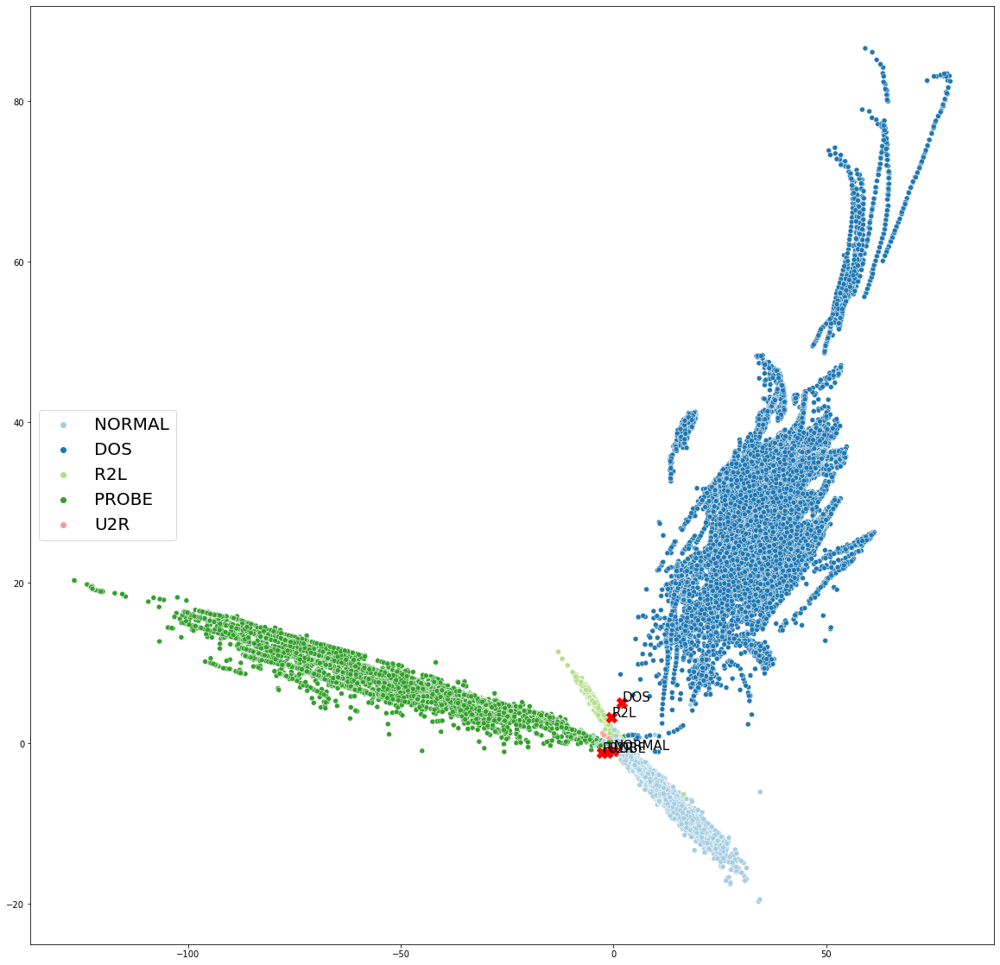

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[49.34701828, 27.08566915],
       [32.7883255 , 17.31930325],
       [10.98760289, -5.94846214],
       ...,
       [27.73192204, 15.26332393],
       [ 7.2452712 , -3.84731024],
       [ 0.08679582,  0.19253434]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 1.90807333  5.10778552]
 [-0.05967949 -0.90207567]
 [-2.64845626 -1.17741498]
 [-0.46145669  3.228826  ]
 [-1.42623828 -1.15938285]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


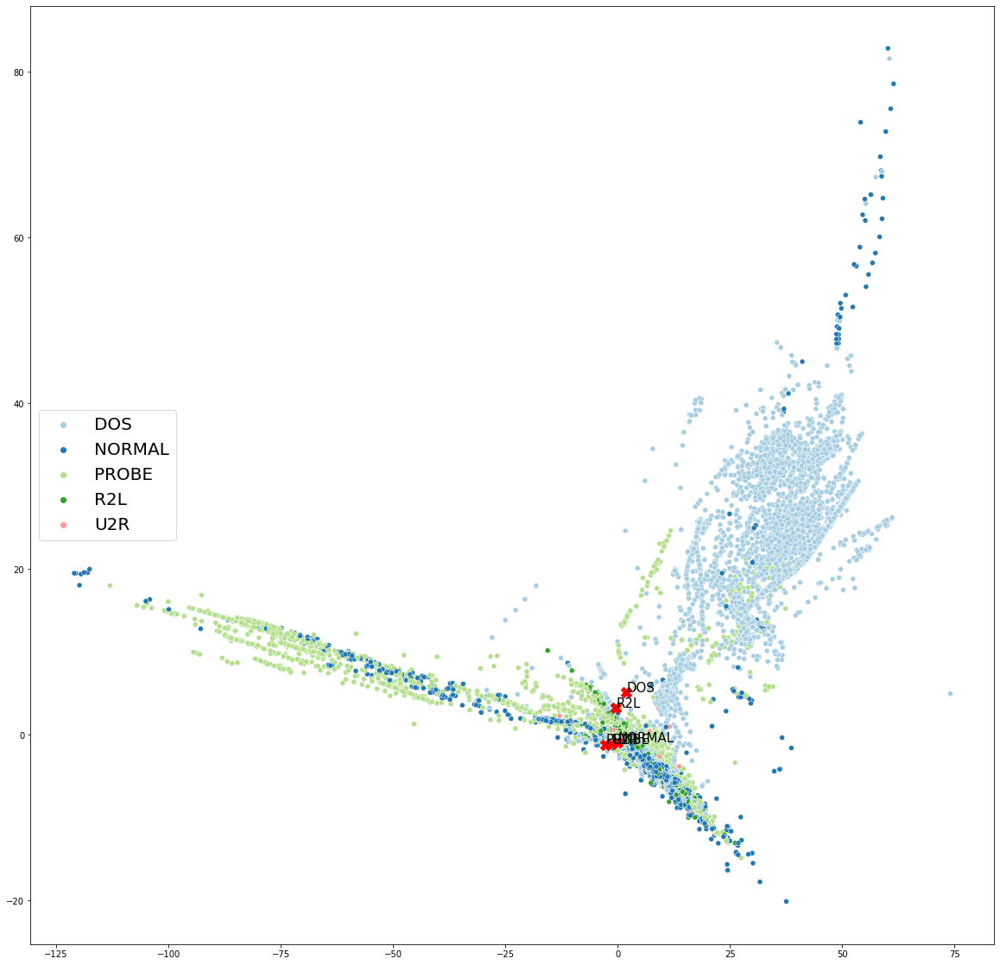

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromPrediction(model_out_classification.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.140225
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000629
Minutes elapsed: 0.000521
Minutes elapsed: 3.796553


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.607258,222257.847663,0.470902


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.99807,0.993375,0.993942,0.998895,0.993376,0.994509,0.993942


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000000
Minutes elapsed: 0.000260
Minutes elapsed: 0.123519


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.261048,10814.575709,3.935007


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.458755,0.408737,0.469113,0.669405,0.408903,0.538189,0.464721


## 3.12 Model: 5 labels, RLB-CL, WNAMM (1,0.5,1,0.5), Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v17 v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model_1(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(20, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (100, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    avg_dist_to_false = tf.reduce_mean(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - 0.5*min_dist_to_false,(-1,1))
    out_avg = tf.reshape(dist_to_true - 0.5*avg_dist_to_false,(-1,1))
    
    xembed_mas_distancias = tf.reshape(tf.concat([x_embed,mat_dist], axis = 1),(-1,embed_dim+in_dim_label))
    # classification output
    n = Dense (100, activation='relu')(xembed_mas_distancias)
    n = Dense (50, activation='relu')(n)
    out_classification = Dense(in_dim_label,activation='softmax')(n)

    # model output
    m = Model(inputs=[in_x,in_index_label],outputs= [out, out_avg]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels
    m_out_classification = Model(inputs=in_x, outputs= out_classification)  # classification output
    m_xembed_mas_distancias = Model(inputs=in_x, outputs= xembed_mas_distancias) 

    m.compile(loss=[dummy_loss_max_margin, dummy_loss_max_margin], optimizer=Adam(0.001), metrics=['mse','mse'] , loss_weights = [0.5,0.5] )
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist, m_out_classification,m_xembed_mas_distancias)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist, model_out_classification,model_xembed_mas_distancias = create_model_1(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "functional_337"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_43 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_105 (Lambda)             (None, 5, 5)         0           input_43[0][0]                   
__________________________________________________________________________________________________
dense_294 (Dense)               (None, 100)          12300       input_43[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_84 (T [(None, 5)]          0           lambda_105[0][0]                 
_____________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "functional_339"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_43 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_294 (Dense)            (None, 100)               12300     
_________________________________________________________________
dense_295 (Dense)            (None, 100)               10100     
_________________________________________________________________
dense_296 (Dense)            (None, 2)                 202       
Total params: 22,602
Trainable params: 22,602
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "functional_341"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_43 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_105 (Lambda)             (None, 5, 5)         0           input_43[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_84 (T [(None, 5)]          0           lambda_105[0][0]                 
__________________________________________________________________________________________________
tf_op_layer_strided_slice_85 (T [(None, 5)]          0           lambda_105[0][0]                 
_____________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# Train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,y_train],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100778/100778 [==============================] - 14s 143us/sample - loss: 0.1059 - tf_op_layer_Reshape_81_loss: 0.1270 - tf_op_layer_Reshape_82_loss: 0.0847 - tf_op_layer_Reshape_81_mean_squared_error: 1.1568 - tf_op_layer_Reshape_82_mean_squared_error: 2.0813 - val_loss: 0.0323 - val_tf_op_layer_Reshape_81_loss: 0.0413 - val_tf_op_layer_Reshape_82_loss: 0.0232 - val_tf_op_layer_Reshape_81_mean_squared_error: 1.2208 - val_tf_op_layer_Reshape_82_mean_squared_error: 2.4984
Epoch 2/100
100778/100778 [==============================] - 10s 98us/sample - loss: 0.0208 - tf_op_layer_Reshape_81_loss: 0.0281 - tf_op_layer_Reshape_82_loss: 0.0135 - tf_op_layer_Reshape_81_mean_squared_error: 1.4433 - tf_op_layer_Reshape_82_mean_squared_error: 3.1560 - val_loss: 0.0153 - val_tf_op_layer_Reshape_81_loss: 0.0214 - val_tf_op_layer_Reshape_82_loss: 0.0092 - val_tf_op_layer_Reshape_81_mean_squared_error: 1.3735 - val_tf_op_layer_Reshape_82_m

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],
                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

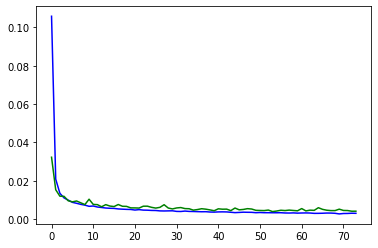

Minimum val_loss at epoch 54 = 0.0039


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()


# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)


### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.023321
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
#Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7555447125621008
F1 =  0.7214156635291842
Precision_score =  0.8032122650749958
recall_score =  0.7555447125621008
roc_auc_score =  0.8511203792573949
matthews_corr_score =  0.6392013502533419


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.764017,0.771595,0.66166,0.925342
1,DOS,0.933863,0.893003,0.96063,0.834272
2,R2L,0.897578,0.179751,0.969349,0.0990603
3,PROBE,0.93302,0.674148,0.705829,0.645188
4,U2R,0.982612,0.0485437,0.833333,0.025


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[  0.1924937 ,   0.63022367],
       [  0.03636197,   0.34799343],
       [-12.0716341 ,   9.2866546 ],
       ...,
       [  0.2000919 ,   0.4260332 ],
       [-12.00613872,   9.27212367],
       [ -0.07805398,  -0.0232387 ]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-8.11100587  6.80452913]
 [ 0.11021962  0.31386371]
 [ 3.61618236  1.90017168]
 [-1.28735034 -2.25426955]
 [ 2.36080355 -2.47590702]]


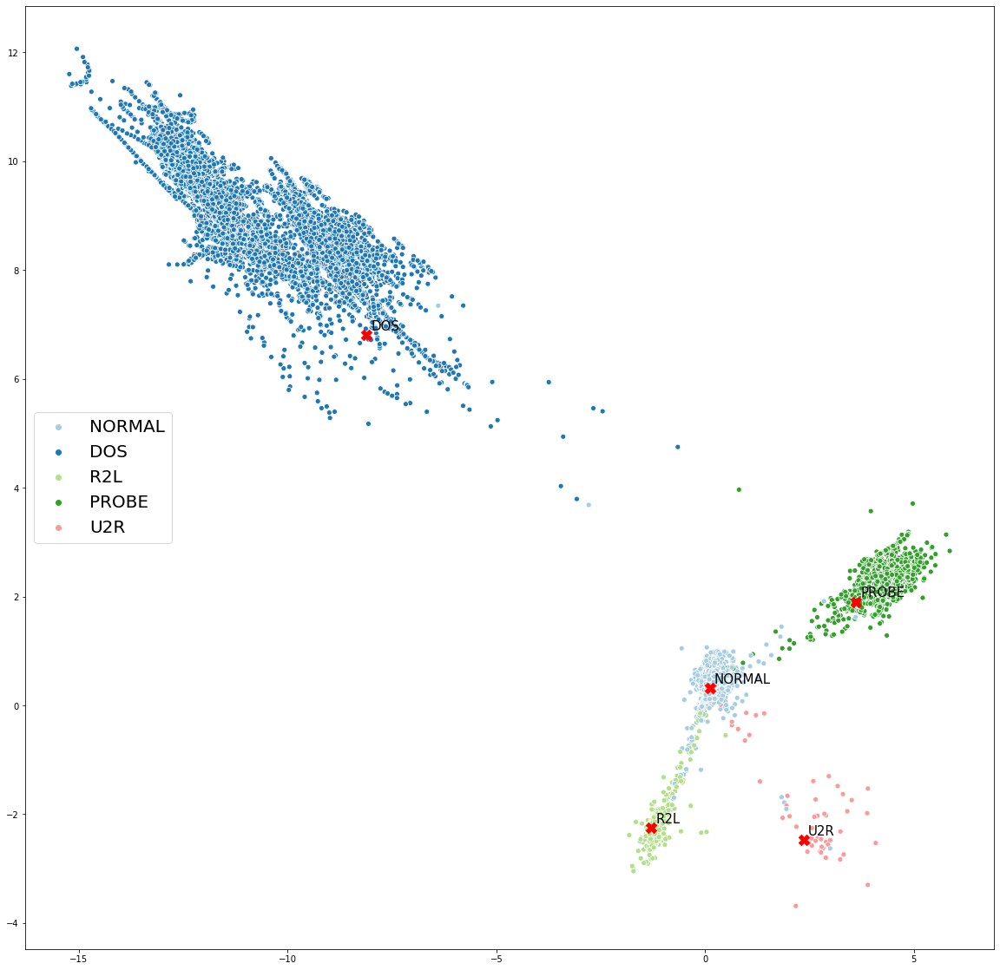

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[ -9.62987625,   8.69811616],
       [ -8.26512658,   8.28120606],
       [  0.19597485,   0.65149846],
       ...,
       [-14.14298398,  10.62967604],
       [  0.15861997,   0.4568267 ],
       [  3.74756813,   1.8666241 ]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-8.11100587  6.80452913]
 [ 0.11021962  0.31386371]
 [ 3.61618236  1.90017168]
 [-1.28735034 -2.25426955]
 [ 2.36080355 -2.47590702]]


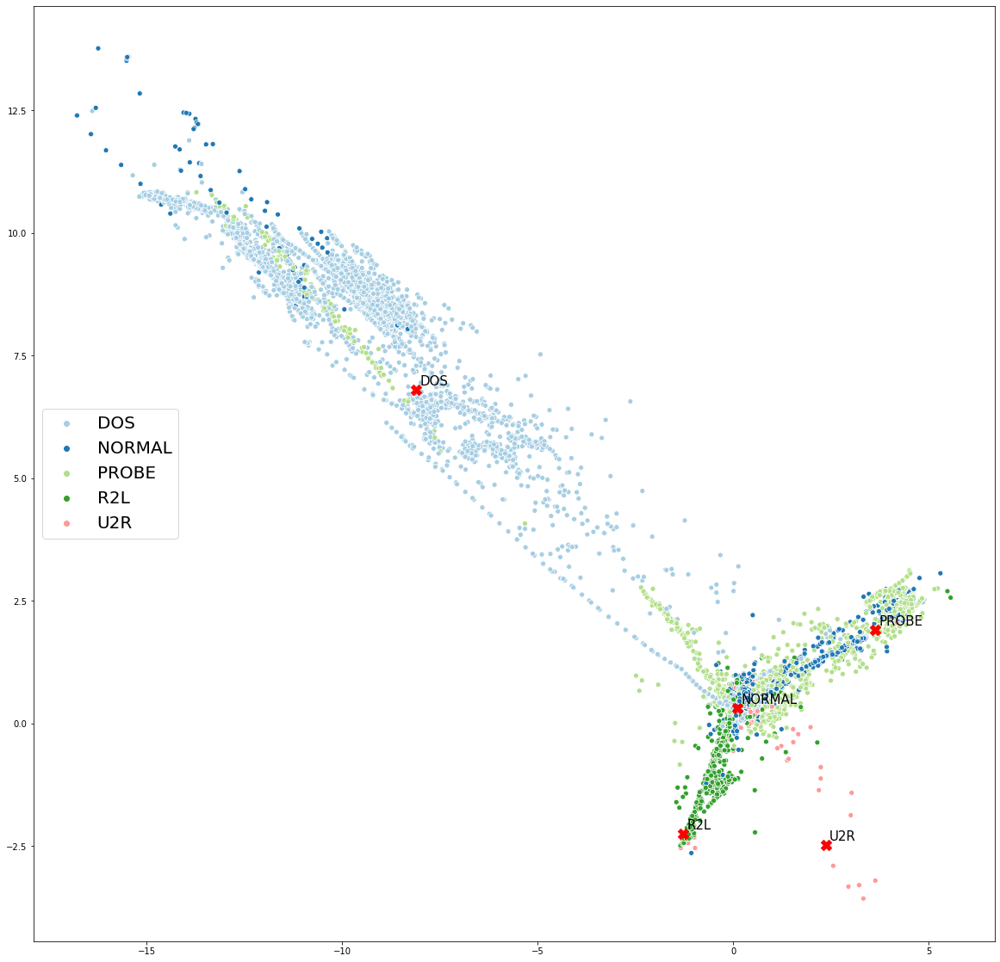

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.097607
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000466
Minutes elapsed: 0.000467
Minutes elapsed: 3.885526


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.925758,2.095643e+06,0.192773


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.997669,0.991915,0.992876,0.998666,0.991915,0.993837,0.992875


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000100
Minutes elapsed: 0.000100
Minutes elapsed: 0.128792


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.798365,116110.010693,0.4174


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
d:\anaconda\envs\tensorflow2-new\lib\site-packages\sklearn\metrics\cluster\supervised.py:859: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.454078,0.417596,0.486908,0.669432,0.417759,0.567504,0.481252


## 3.13 Model: 5 labels, RLB-CL, NAMM, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v17 NAMS v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(20, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (100, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    avg_dist_to_false = tf.reduce_mean(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - min_dist_to_false,(-1,1))
    out_avg = tf.reshape(dist_to_true - avg_dist_to_false,(-1,1))
    
    xembed_mas_distancias = tf.reshape(tf.concat([x_embed,mat_dist], axis = 1),(-1,embed_dim+in_dim_label))
    # classification output
    n = Dense (100, activation='relu')(xembed_mas_distancias)
    n = Dense (50, activation='relu')(n)
    out_classification = Dense(in_dim_label,activation='softmax')(n)

    # salida del modelo
    m = Model(inputs=[in_x,in_index_label],outputs= [out, out_avg]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels
    m_out_classification = Model(inputs=in_x, outputs= out_classification)  # classification output
    m_xembed_mas_distancias = Model(inputs=in_x, outputs= xembed_mas_distancias) 

    m.compile(loss=[dummy_loss_max_margin, dummy_loss_max_margin], optimizer=Adam(0.001), metrics=['mse','mse'] , loss_weights = [0.5,0.5] )
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist, m_out_classification,m_xembed_mas_distancias)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist, model_out_classification,model_xembed_mas_distancias = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "model_18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 5, 5)         0           input_7[0][0]                    
__________________________________________________________________________________________________
dense_55 (Dense)                (None, 100)          12300       input_7[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice_15 (T [(None, 5)]          0           lambda_18[0][0]                  
___________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense_55 (Dense)             (None, 100)               12300     
_________________________________________________________________
dense_56 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_57 (Dense)             (None, 2)                 202       
Total params: 22,602
Trainable params: 22,602
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 5, 5)         0           input_7[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice_15 (T [(None, 5)]          0           lambda_18[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_16 (T [(None, 5)]          0           lambda_18[0][0]                  
___________________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,y_train],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
 99950/100778 [============================>.] - ETA: 0s - loss: 0.0389 - tf_op_layer_Reshape_11_loss: 0.0526 - tf_op_layer_Reshape_12_loss: 0.0251 - tf_op_layer_Reshape_11_mean_squared_error: 1.8421 - tf_op_layer_Reshape_12_mean_squared_error: 2.7847

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


100778/100778 [==============================] - 9s 85us/sample - loss: 0.0386 - tf_op_layer_Reshape_11_loss: 0.0524 - tf_op_layer_Reshape_12_loss: 0.0249 - tf_op_layer_Reshape_11_mean_squared_error: 1.8478 - tf_op_layer_Reshape_12_mean_squared_error: 2.7991 - val_loss: 0.0078 - val_tf_op_layer_Reshape_11_loss: 0.0136 - val_tf_op_layer_Reshape_12_loss: 0.0020 - val_tf_op_layer_Reshape_11_mean_squared_error: 2.6976 - val_tf_op_layer_Reshape_12_mean_squared_error: 4.6140
Epoch 2/100
100778/100778 [==============================] - 7s 71us/sample - loss: 0.0067 - tf_op_layer_Reshape_11_loss: 0.0117 - tf_op_layer_Reshape_12_loss: 0.0017 - tf_op_layer_Reshape_11_mean_squared_error: 3.6953 - tf_op_layer_Reshape_12_mean_squared_error: 5.9014 - val_loss: 0.0050 - val_tf_op_layer_Reshape_11_loss: 0.0087 - val_tf_op_layer_Reshape_12_loss: 0.0014 - val_tf_op_layer_Reshape_11_mean_squared_error: 4.6348 - val_tf_op_layer_Reshape_12_mean_squared_error: 7.7323
Epoch 3/100
100778/100778 [=============

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],
                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

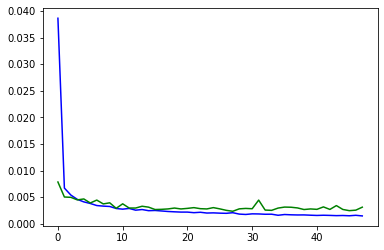

Minimum val_loss at epoch 28 = 0.0023


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()


# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)

## Find the minimum validation loss during the training
#min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
#print('Minimum loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
#min_loss = round(min_loss, 4)

### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

Minutes elapsed: 0.018243
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
# Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7716022001419447
F1 =  0.7442413163615376
Precision_score =  0.7730002595065514
recall_score =  0.7716022001419447
roc_auc_score =  0.8207464711401867
matthews_corr_score =  0.6627752339956786


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.794579,0.79677,0.694249,0.934816
1,DOS,0.934927,0.894952,0.96035,0.837892
2,R2L,0.894251,0.234425,0.651786,0.142913
3,PROBE,0.941093,0.716965,0.740643,0.694754
4,U2R,0.978353,0.0792453,0.161538,0.0525


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-14.87543916,  -5.20534975],
       [ -5.12670807,  -2.13605595],
       [  7.49415202,   4.09763853],
       ...,
       [ -8.84984852,  -2.72194583],
       [  6.42135603,   3.84095943],
       [-18.36223809,  -8.81291858]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[ 3.1994698   2.19385752]
 [-1.21441631 -1.51049362]
 [-2.54801043  6.00682015]
 [ 1.16079526 -5.51683857]
 [ 0.76364709 -2.66784247]]


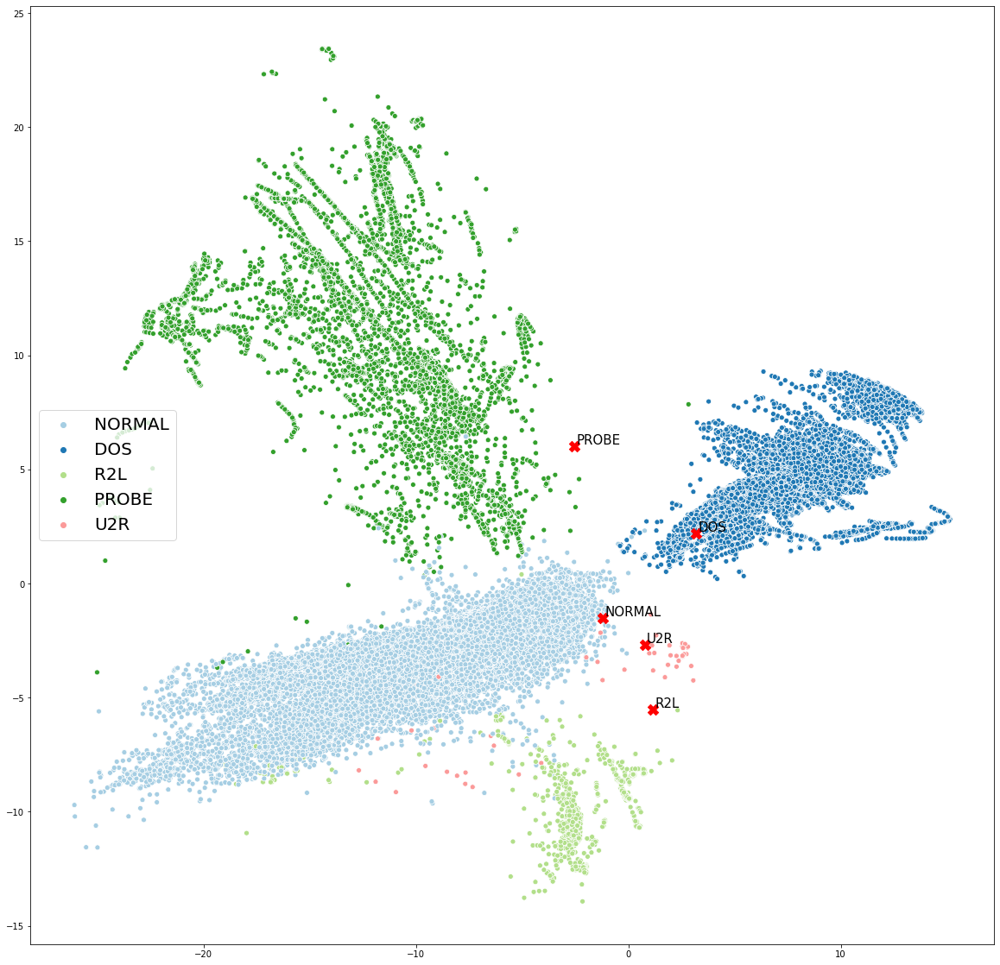

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[13.05571393,  7.91899132],
       [10.50254213,  8.77206833],
       [-8.56220279, -3.21604713],
       ...,
       [ 3.07417591,  1.95608314],
       [-4.75632797, -2.53923844],
       [-5.22478736,  6.55826693]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[ 3.1994698   2.19385752]
 [-1.21441631 -1.51049362]
 [-2.54801043  6.00682015]
 [ 1.16079526 -5.51683857]
 [ 0.76364709 -2.66784247]]


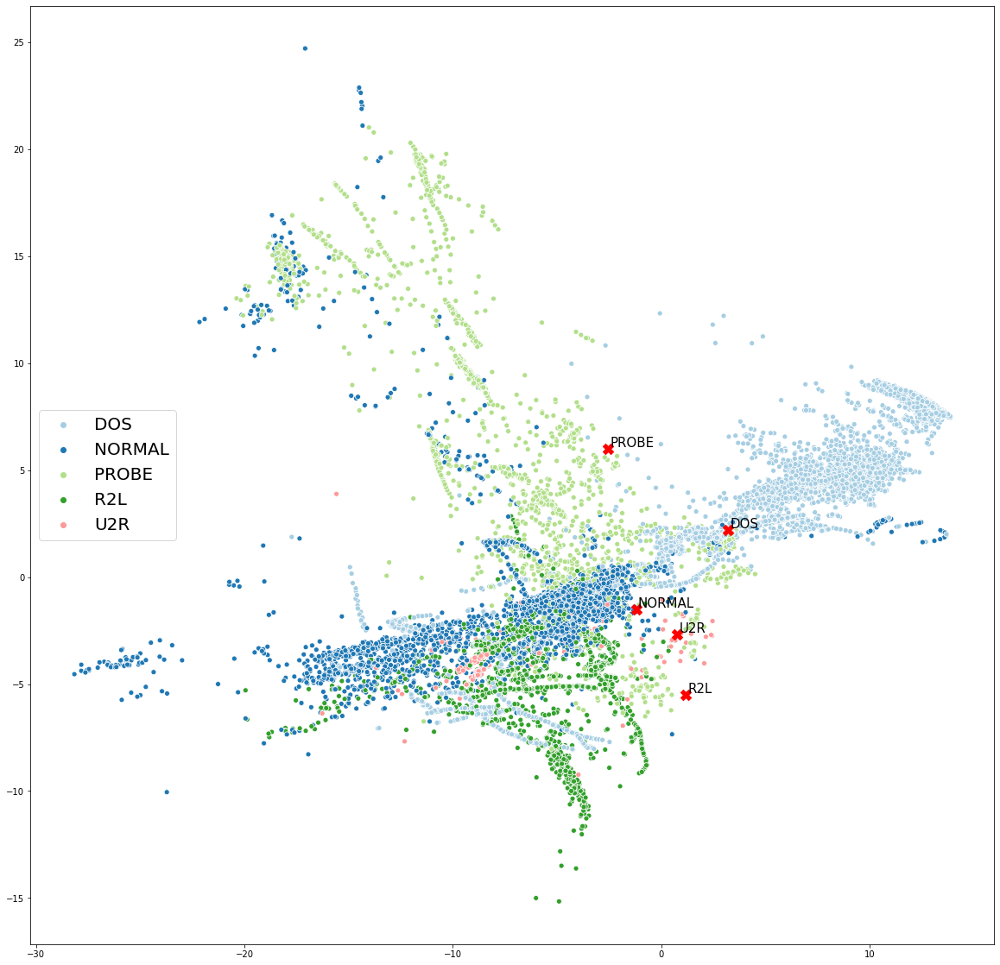

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.064231
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000668
Minutes elapsed: 0.000637
Minutes elapsed: 4.202877


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.601823,159640.483879,0.538005


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.996979,0.990694,0.990694,0.998271,0.989313,0.99208,0.990694


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000154
Minutes elapsed: 0.000155
Minutes elapsed: 0.134994


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.336474,17514.755521,0.728926


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.504705,0.496769,0.496925,0.694042,0.446853,0.559635,0.496925


## 3.14 Model: 5 labels, RLB-CL, AMM, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v12 AMS v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    #min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    avg_dist_to_false = tf.reduce_mean(dist_to_false, axis = 1)
    out = tf.reshape(dist_to_true - avg_dist_to_false,(-1,1))
    
    # model outputs
    m = Model(inputs=[in_x,in_index_label],outputs= out) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels

    m.compile(loss=dummy_loss_max_margin, optimizer=Adam(0.001), metrics=['mse'])
    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "model_32"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_30 (Lambda)              (None, 5, 5)         0           input_11[0][0]                   
__________________________________________________________________________________________________
dense_87 (Dense)                (None, 100)          12300       input_11[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_25 (T [(None, 5)]          0           lambda_30[0][0]                  
___________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 122)]             0         
_________________________________________________________________
dense_87 (Dense)             (None, 100)               12300     
_________________________________________________________________
dense_88 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_89 (Dense)             (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "model_34"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda_30 (Lambda)              (None, 5, 5)         0           input_11[0][0]                   
__________________________________________________________________________________________________
tf_op_layer_strided_slice_25 (T [(None, 5)]          0           lambda_30[0][0]                  
__________________________________________________________________________________________________
tf_op_layer_strided_slice_26 (T [(None, 5)]          0           lambda_30[0][0]                  
___________________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# train the model
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],y_train,
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100400/100778 [============================>.] - ETA: 0s - loss: 0.0222 - mean_squared_error: 1.6310

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


100778/100778 [==============================] - 9s 86us/sample - loss: 0.0221 - mean_squared_error: 1.6324 - val_loss: 0.0018 - val_mean_squared_error: 1.9841
Epoch 2/100
100778/100778 [==============================] - 7s 70us/sample - loss: 0.0017 - mean_squared_error: 2.2069 - val_loss: 0.0015 - val_mean_squared_error: 2.3496
Epoch 3/100
100778/100778 [==============================] - 7s 73us/sample - loss: 0.0011 - mean_squared_error: 2.4170 - val_loss: 0.0013 - val_mean_squared_error: 2.6349
Epoch 4/100
100778/100778 [==============================] - 7s 66us/sample - loss: 9.5449e-04 - mean_squared_error: 2.5330 - val_loss: 9.1171e-04 - val_mean_squared_error: 3.0241
Epoch 5/100
100778/100778 [==============================] - 7s 67us/sample - loss: 7.7456e-04 - mean_squared_error: 2.8746 - val_loss: 6.9692e-04 - val_mean_squared_error: 3.1439
Epoch 6/100
100778/100778 [==============================] - 7s 67us/sample - loss: 6.7244e-04 - mean_squared_error: 2.8815 - val_loss: 

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],
                              'train_acc': history.history['mean_squared_error'],
                              'valid_acc': history.history['val_mean_squared_error'],
                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

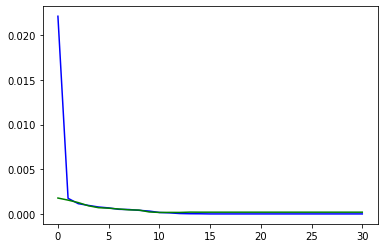

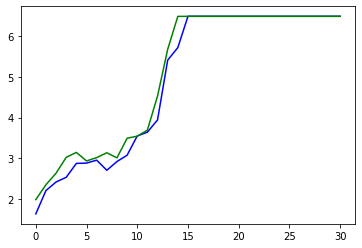

Minimum val_loss at epoch 11 = 0.0002


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()

plt.plot(summary_stats.train_acc, 'b') # blue
plt.plot(summary_stats.valid_acc, 'g') # green
plt.show()


# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)


### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Minutes elapsed: 0.018223
['DOS' 'DOS' 'R2L' ... 'DOS' 'PROBE' 'PROBE']


In [ ]:
#Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.6079222853087296
F1 =  0.5942655438199321
Precision_score =  0.6315394050115736
recall_score =  0.6079222853087296
roc_auc_score =  0.7842811388939545
matthews_corr_score =  0.44343482213435753


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.714203,0.604408,0.748479,0.506848
1,DOS,0.729462,0.685083,0.557058,0.889515
2,R2L,0.904631,0.52201,0.603909,0.459671
3,PROBE,0.88671,0.422955,0.466833,0.386617
4,U2R,0.980837,0.152941,0.354545,0.0975


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[ 7.61573273, -2.11389015],
       [-0.28439713,  0.08951117],
       [-0.76613222, -0.42745422],
       ...,
       [ 0.40202663, -0.67266534],
       [-0.67837387, -0.41523647],
       [11.13428977, -2.75957195]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-1.25955224 -0.47784816]
 [ 0.93883858  0.26275758]
 [-0.36329051  0.88730615]
 [ 1.62620253 -3.97714029]
 [ 0.01367475  3.85158352]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


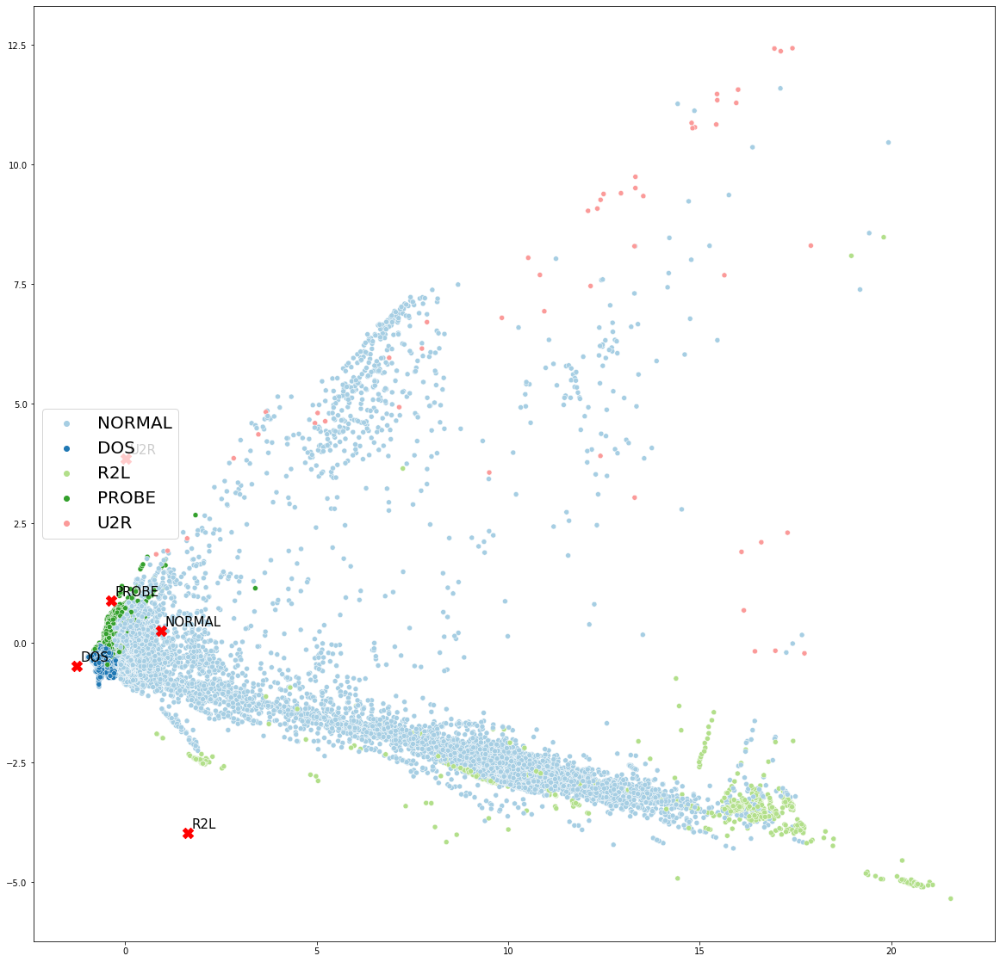

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-1.25955224 -0.47784816]
 [ 0.93883858  0.26275758]
 [-0.36329051  0.88730615]
 [ 1.62620253 -3.97714029]
 [ 0.01367475  3.85158352]]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


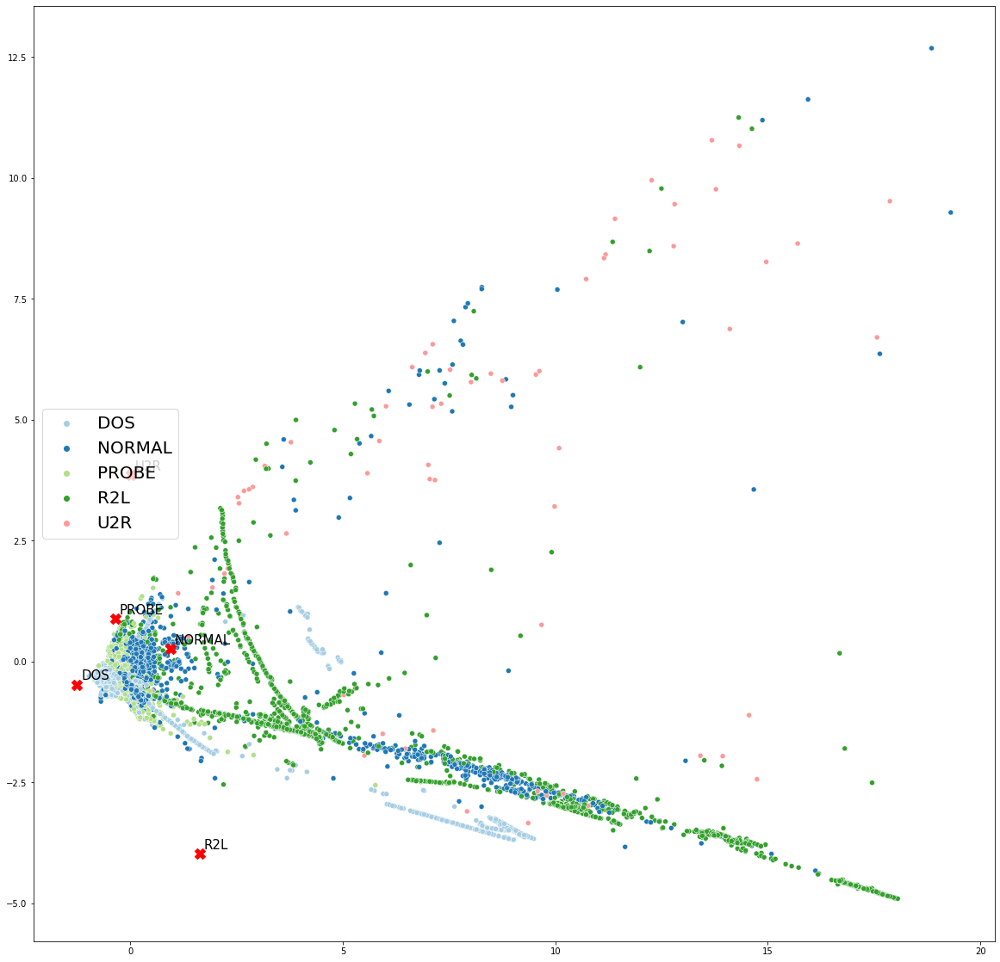

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.068430
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000619
Minutes elapsed: 0.000600
Minutes elapsed: 4.205660


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.370264,249449.401766,0.761692


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.267048,0.379359,0.379396,0.563079,0.415547,0.349032,0.379396


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000160
Minutes elapsed: 0.000174
Minutes elapsed: 0.133043


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.19628,22365.690495,0.987346


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.217512,0.249637,0.249859,0.490839,0.236498,0.264819,0.249859


## 3.15 Model: 5 labels, RLB-CL, ConN, Embed Dim: 2, Distance: Euclidean

In [ ]:
le = LabelEncoder()
index_label_train = le.fit_transform (YTrainAN5)
index_label_test = le.transform (YTestAN5)

print(lb5.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))
print(le.transform(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']))

x_train, x_test, label_train, label_test, y_train, y_test = XTrainM, XTestM, \
                                                            YTrainAN5MOhe, YTestAN5MOhe,\
                                                            np.zeros(len(XTrainM)), np.zeros(len(XTestM))
print (x_train.shape, x_test.shape, label_train.shape, label_test.shape, y_train.shape, y_test.shape)


[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]
[0 1 2 3 4]
(125973, 122) (22544, 122) (125973, 5) (22544, 5) (125973,) (22544,)


In [ ]:
# save the weights and summary stats
file_name = 'CLC_NSL_3_cplet dim2_v12 ConN nuevo v1.1'
save_best_weights = file_name + '_best.h5'
save_last_weights = file_name + '_last.h5'
save_summary_stats = file_name + '.csv'

in_dim_x = x_train.shape[1]
in_dim_label = label_train.shape[1]
out_dim = 1 # yes, no

print(in_dim_x)
print(in_dim_label)
print(out_dim)

122
5
1


### Prepare the model

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
vocab_size = in_dim_label  
embed_dim = 2

list_labels = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

def create_all_labels(in_x):
  sal = tf.cast(tf.reshape(tf.tile(lb5.transform(list_labels),
                                  [tf.shape(in_x)[0],1]),[-1,in_dim_label,in_dim_label]), 
                                   dtype=tf.float64)
  return sal


def create_model(in_dim_x,in_dim_label,embed_dim):
    
    #input X
    in_x = Input(shape=(in_dim_x,))  
    
    # Integer vector with range [0,in_dim_label-1] and length equal to X.shape[0]. Index of the correct label
    in_index_label = Input(shape=(1,),dtype=tf.int32) 
    
    in_labels = Lambda(lambda x : create_all_labels(x))(in_x) # to allow saving the weigths 
    
    
    #working lists
    lst_labels=[]
    lst_dist=[]

    #labels embeddings
    for i in range(in_dim_label):
        lst_labels.append(Dense(10, activation='relu')(in_labels[:,:,i]))
        lst_labels[i] = Dense(embed_dim, activation='linear')(lst_labels[i])

    #embedding of x
    u = Dense (100, activation='relu')(in_x)
    u = Dense (50, activation='relu')(u)
    x_embed = Dense(embed_dim,activation='linear')(u)

    # similarity measure
    for i in range(in_dim_label):
        lst_dist.append(Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([x_embed, lst_labels[i]]))

    mat_dist = tf.squeeze(tf.stack(lst_dist, axis=1))
    one_hot_mask = tf.reshape(tf.one_hot(in_index_label, in_dim_label, on_value = True, off_value = False, 
                                         axis = 1, dtype = tf.bool),(-1,in_dim_label))
    one_hot_mask_neg = tf.logical_not(one_hot_mask)
    dist_to_true = tf.boolean_mask(mat_dist, one_hot_mask)
    dist_to_false = tf.reshape(tf.boolean_mask(mat_dist, one_hot_mask_neg),(-1,in_dim_label-1))
    min_dist_to_false = tf.reduce_min(dist_to_false, axis = 1)
    out1 = tf.reshape( - min_dist_to_false,(-1,1))
    out2 = tf.reshape( dist_to_true,(-1,1))
    
    # model output
    m = Model(inputs=[in_x,in_index_label],outputs= [out1,out2]) # loss
    m_embed_x = Model(inputs=in_x, outputs= x_embed)  # embedding of x
    m_embed_labels = Model(inputs=in_x, outputs= lst_labels) #embedding of labels
    m_mat_dist = Model(inputs=in_x, outputs= mat_dist) # matrix of distances between x and labels
    m_lst_dist = Model(inputs=in_x, outputs= lst_dist) # list of distances between x and labels

    m.compile(loss=[dummy_loss_max_margin, dummy_loss], optimizer=Adam(0.001), metrics=['mse','mse'] , loss_weights = [0.5,0.5] )

    return(m, m_embed_x , m_embed_labels, m_mat_dist, m_lst_dist)

In [ ]:
#create model
model, model_embed_x , model_embed_labels, model_mat_dist, model_lst_dist = create_model(in_dim_x, in_dim_label, embed_dim) 

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 5, 5)         0           input_1[0][0]                    
__________________________________________________________________________________________________
dense_10 (Dense)                (None, 100)          12300       input_1[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice (Tens [(None, 5)]          0           lambda[0][0]                     
______________________________________________________________________________________________

In [ ]:
model_embed_x.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 122)]             0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               12300     
_________________________________________________________________
dense_11 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_12 (Dense)             (None, 2)                 102       
Total params: 17,452
Trainable params: 17,452
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_embed_labels.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 122)]        0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 5, 5)         0           input_1[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice (Tens [(None, 5)]          0           lambda[0][0]                     
__________________________________________________________________________________________________
tf_op_layer_strided_slice_1 (Te [(None, 5)]          0           lambda[0][0]                     
____________________________________________________________________________________________

###  Training

In [ ]:
t0 = time.time()
# Entrenar el modelo
callbacks = [ModelCheckpoint(save_best_weights, monitor='val_loss', save_best_only=True, mode='auto'),
             EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='auto')
            ]

history = model.fit([x_train,index_label_train],[y_train,y_train],
                    batch_size=50,
                    epochs=100,
                    validation_split=0.2,
                    verbose=1,
                    shuffle=True,
                    initial_epoch = 0,
                    callbacks=callbacks)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Train on 100778 samples, validate on 25195 samples
Epoch 1/100
100700/100778 [============================>.] - ETA: 0s - loss: 0.0489 - tf_op_layer_Reshape_2_loss: 0.0429 - tf_op_layer_Reshape_3_loss: 0.0550 - tf_op_layer_Reshape_2_mean_squared_error: 1.0313 - tf_op_layer_Reshape_3_mean_squared_error: 0.0244

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


100778/100778 [==============================] - 8s 81us/sample - loss: 0.0489 - tf_op_layer_Reshape_2_loss: 0.0428 - tf_op_layer_Reshape_3_loss: 0.0550 - tf_op_layer_Reshape_2_mean_squared_error: 1.0314 - tf_op_layer_Reshape_3_mean_squared_error: 0.0244 - val_loss: 0.0175 - val_tf_op_layer_Reshape_2_loss: 0.0083 - val_tf_op_layer_Reshape_3_loss: 0.0267 - val_tf_op_layer_Reshape_2_mean_squared_error: 1.1133 - val_tf_op_layer_Reshape_3_mean_squared_error: 0.0088
Epoch 2/100
100778/100778 [==============================] - 8s 75us/sample - loss: 0.0150 - tf_op_layer_Reshape_2_loss: 0.0068 - tf_op_layer_Reshape_3_loss: 0.0232 - tf_op_layer_Reshape_2_mean_squared_error: 1.1047 - tf_op_layer_Reshape_3_mean_squared_error: 0.0071 - val_loss: 0.0136 - val_tf_op_layer_Reshape_2_loss: 0.0052 - val_tf_op_layer_Reshape_3_loss: 0.0220 - val_tf_op_layer_Reshape_2_mean_squared_error: 1.1065 - val_tf_op_layer_Reshape_3_mean_squared_error: 0.0059
Epoch 3/100
100778/100778 [=============================

In [ ]:
# Aggregate the summary statistics
summary_stats = pd.DataFrame({'epoch': [ i + 1 for i in history.epoch ],

                              'train_loss': history.history['loss'],
                              'valid_loss': history.history['val_loss']})

In [ ]:
#summary_stats = pd.read_csv(save_summary_stats)
summary_stats.to_csv(save_summary_stats)    

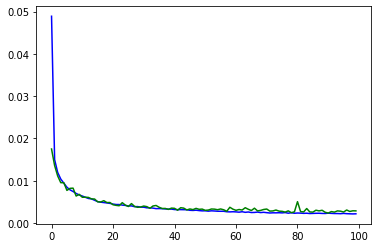

Minimum val_loss at epoch 91 = 0.0023


In [ ]:
plt.plot(summary_stats.train_loss, 'b') # blue
plt.plot(summary_stats.valid_loss, 'g') # green
plt.show()

# Find the min validation loss during the training
min_loss, idx = min((loss, idx) for (idx, loss) in enumerate(history.history['val_loss']))
print('Minimum val_loss at epoch', '{:d}'.format(idx+1), '=', '{:.4f}'.format(min_loss))
min_loss = round(min_loss, 4)


### Inference

In [ ]:
model.load_weights(save_best_weights)

In [ ]:
t0 = time.time()

y_test_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_test)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))
print(y_test_hat)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Minutes elapsed: 0.011141
['DOS' 'DOS' 'NORMAL' ... 'DOS' 'NORMAL' 'PROBE']


In [ ]:
#Obtain probabilities
ytest_dist_hat = model_mat_dist.predict(x_test)
ytest_prob_hat = (ytest_dist_hat-np.min(ytest_dist_hat))/(np.max(ytest_dist_hat)-np.min(ytest_dist_hat)) # escalamos 0-1
ytest_prob_hat = normalize(ytest_prob_hat, axis=1, norm='l1')
ytest_prob_hat=  1 - ytest_prob_hat

In [ ]:
average_type = 'weighted' # micro' , 'weighted'
print('Performance measures on Test data')
print('Accuracy =  {}'.format(accuracy_score( lb5.inverse_transform(YTestAN5MOhe),y_test_hat)))

print('F1 =  {}'.format(f1_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('Precision_score =  {}'.format(precision_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('recall_score =  {}'.format(recall_score(lb5.inverse_transform(YTestAN5MOhe),y_test_hat, average=average_type)))

print('roc_auc_score =  {}'.format(roc_auc_score(YTestAN5MOhe,ytest_prob_hat)))

print('matthews_corr_score =  {}'.format(matthews_corrcoef(lb5.inverse_transform(YTestAN5MOhe), y_test_hat)))

Performance measures on Test data
Accuracy =  0.7749290276792051
F1 =  0.7286871533002838
Precision_score =  0.8138028790112052
recall_score =  0.7749290276792051
roc_auc_score =  0.8279615499087548
matthews_corr_score =  0.6736719463422506


### Perform test evaluation one vs. rest

In [ ]:
yt_app = lb5.inverse_transform(YTestAN5MOhe)
perf_per_class = pd.DataFrame(index=range(len(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).unique())),columns=['name', 'acc','f1', 'pre','rec'])
for i,x in enumerate(pd.Series(lb5.inverse_transform(YTestAN5MOhe)).value_counts().index):
    y_test_hat_check = y_test_hat.copy()
    y_test_hat_check[y_test_hat_check != x] = 'OTHER'
    yt_app = lb5.inverse_transform(YTestAN5MOhe).copy()
    yt_app[yt_app != x] = 'OTHER'
    ac=accuracy_score( yt_app,y_test_hat_check)
    f1=f1_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    pr=precision_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    re=recall_score( yt_app,y_test_hat_check,pos_label=x, average='binary')
    perf_per_class.iloc[i]=[x,ac,f1,pr,re]

In [ ]:
# performance measures per class for test data
perf_per_class

,name,acc,f1,pre,rec
0,NORMAL,0.78939,0.798609,0.678976,0.969416
1,DOS,0.932044,0.889737,0.960379,0.828774
2,R2L,0.889017,0.0443086,0.90625,0.0227095
3,PROBE,0.957017,0.788843,0.834871,0.747625
4,U2R,0.98239,0.0340633,0.636364,0.0175


###  Cluster visualization

#### Training set

In [ ]:
num_classes = ['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R']

In [ ]:
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

array([[-0.29579824, -0.34011988],
       [-0.2963011 , -0.34052848],
       [-0.28392114,  0.68430704],
       ...,
       [-0.29556488, -0.34023368],
       [-0.28384982,  0.68439714],
       [-0.29563246, -0.33990667]])

In [ ]:
embedding_label_train = np.array(model_embed_labels.predict(x_train))
embedding_label_train = np.stack(embedding_label_train, axis=1)[0,:,:]
print(embedding_label_train)

[[-0.28339772  0.68485884]
 [-0.29562856 -0.3400804 ]
 [ 0.73464566 -0.14564716]
 [ 0.37224858 -1.14708378]
 [ 0.76454017  0.9170166 ]]


In [ ]:
#imagen seleccionada

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


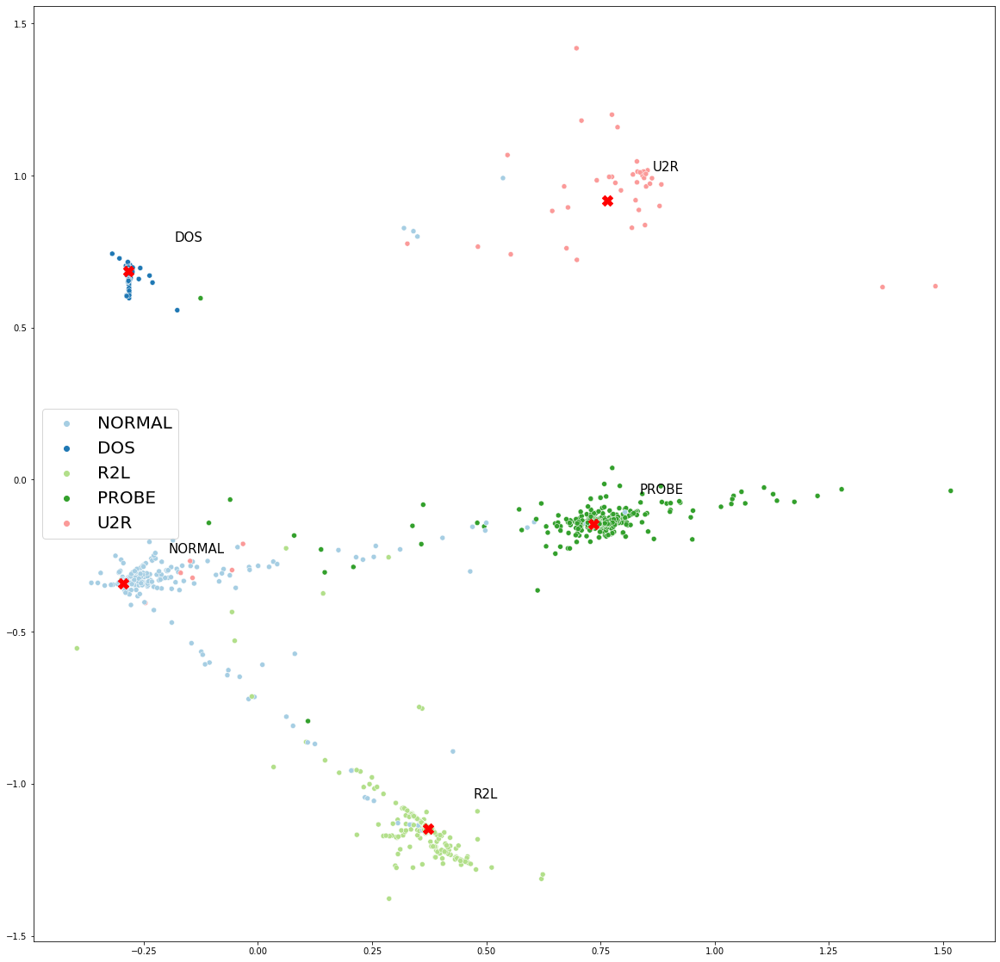

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_train[:,0],embedding_x_train[:,1], 
            hue=lb5.inverse_transform(label_train),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_train[:,0],embedding_label_train[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_train[i,0]+0.1, embedding_label_train[i,1]+0.1),fontsize=15)
plt.show()

#### Test set

In [ ]:
embedding_x_test = np.array(model_embed_x.predict(x_test))
embedding_x_test

array([[-0.28348912,  0.68458357],
       [-0.2834814 ,  0.6846403 ],
       [-0.29575813, -0.33992394],
       ...,
       [-0.28618076,  0.79571939],
       [-0.29526077, -0.33983594],
       [ 0.5925006 ,  0.01787562]])

In [ ]:
embedding_label_test = np.array(model_embed_labels.predict(x_test))
embedding_label_test = np.stack(embedding_label_test, axis=1)[0,:,:]
print(embedding_label_test)

[[-0.28339772  0.68485884]
 [-0.29562856 -0.3400804 ]
 [ 0.73464566 -0.14564716]
 [ 0.37224858 -1.14708378]
 [ 0.76454017  0.9170166 ]]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


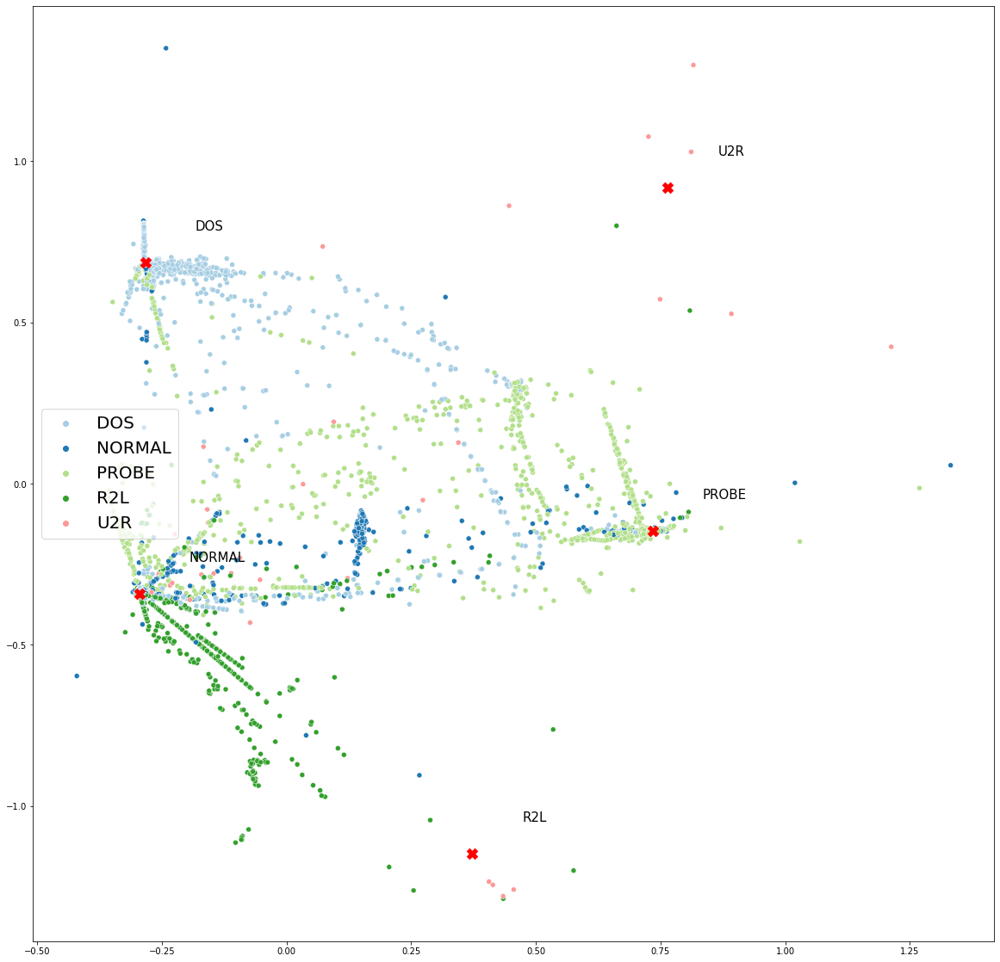

In [ ]:
from matplotlib.colors import ListedColormap
#https://matplotlib.org/examples/color/colormaps_reference.html
import seaborn as sns

fig, ax = plt.subplots(figsize=(20,20))
s =sns.scatterplot(embedding_x_test[:,0],embedding_x_test[:,1], 
            hue=lb5.inverse_transform(label_test),
            palette = "Paired")
plt.legend(loc='center left', prop={'size': 20})
plt.scatter(embedding_label_test[:,0],embedding_label_test[:,1], c="r", marker="X", s=150)
for i, txt in enumerate(num_classes):
    ax.annotate(txt, (embedding_label_test[i,0]+0.1, embedding_label_test[i,1]+0.1),fontsize=15)
plt.show()

### Cluster metrics

In [ ]:
y_test = lb5.inverse_transform(YTestAN5MOhe)
x_test = XTestM
x_train = XTrainM
label_train = YTrainAN5MOhe
label_test = YTestAN5MOhe
y_train = lb5.inverse_transform(YTrainAN5MOhe)


#### Training set

####   Metrics not based on knowing the ground-truth label

In [ ]:
# metrics not based on knowing the ground-truth label
embedding_x_train = np.array(model_embed_x.predict(x_train))
embedding_x_train

t0 = time.time()

ytrain_hat = lb5.inverse_transform(labelOHEncodedFromDistances(model_mat_dist.predict(x_train)))

t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

print(embedding_x_train.shape)

Minutes elapsed: 0.056945
(125973, 2)


In [ ]:
np.unique (ytrain_hat)

array(['DOS', 'NORMAL', 'PROBE', 'R2L', 'U2R'], dtype='<U6')

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_train, ytrain_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_train, ytrain_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000707
Minutes elapsed: 0.000720
Minutes elapsed: 4.318975


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.997612,6.765488e+07,0.158627


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_train, ytrain_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_train, ytrain_hat)  
n_m_i_score = metrics.normalized_mutual_info_score(y_train, ytrain_hat)  
fo_ma_score = metrics.fowlkes_mallows_score(y_train, ytrain_hat)  
homo_score = metrics.homogeneity_score(y_train, ytrain_hat) 
comple_score =metrics.completeness_score(y_train, ytrain_hat)  
v_meas_score = metrics.v_measure_score(y_train, ytrain_hat)  

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.997331,0.991707,0.991707,0.998472,0.990922,0.992494,0.991707


#### Test set

####   Metrics not based on knowing the ground-truth label

In [ ]:
t0 = time.time()
cal_hara_score = metrics.calinski_harabasz_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
d_b_score = metrics.davies_bouldin_score(embedding_x_test, y_test_hat)
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

t0 = time.time()
sil_score = metrics.silhouette_score(embedding_x_test, y_test_hat, metric='euclidean')
t1 = time.time()
print("Minutes elapsed: %f" % ((t1 - t0) / 60.))

Minutes elapsed: 0.000194
Minutes elapsed: 0.000189
Minutes elapsed: 0.140608


In [ ]:
no_labels_cluster_metrics = pd.DataFrame({'silhouette_score': sil_score,
                              'calinski_harabasz_score': cal_hara_score,
                              'davies_bouldin_score':d_b_score},index=[1])
no_labels_cluster_metrics

,silhouette_score,calinski_harabasz_score,davies_bouldin_score
1,0.900472,122778.873435,0.450048


####   Metrics  based on knowing the ground-truth label

In [ ]:
a_r_score = metrics.adjusted_rand_score(y_test, y_test_hat)
a_m_i_score = metrics.adjusted_mutual_info_score(y_test, y_test_hat) 
n_m_i_score = metrics.normalized_mutual_info_score(y_test, y_test_hat) 
fo_ma_score = metrics.fowlkes_mallows_score(y_test, y_test_hat) 
homo_score = metrics.homogeneity_score(y_test, y_test_hat)
comple_score =metrics.completeness_score(y_test, y_test_hat)
v_meas_score = metrics.v_measure_score(y_test, y_test_hat) 

In [ ]:
labels_cluster_metrics = pd.DataFrame({'adjusted_rand_score': a_r_score,
                              'adjusted_mutual_info_score': a_m_i_score,
                              'normalized_mutual_info_score':n_m_i_score,
                             'fowlkes_mallows_score':fo_ma_score,
                              'homogeneity_score':homo_score,
                              'completeness_score':comple_score,
                             'v_measure_score':v_meas_score,
                                      }
                                      ,index=[1])
labels_cluster_metrics

,adjusted_rand_score,adjusted_mutual_info_score,normalized_mutual_info_score,fowlkes_mallows_score,homogeneity_score,completeness_score,v_measure_score
1,0.497699,0.518615,0.518774,0.701351,0.441315,0.629214,0.518774
